# AV Behavior with friction implementation in icy weather

In [1]:
import os
import pandas as pd
pd.set_option('display.max_colwidth', None)
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats
from scipy.stats import norm, binom, poisson
from dtaidistance import dtw
import json

## Testing Parameters

In [2]:
weather_param = [[20,0,0,70,0,10,0,10,10],
    [20,0,0,70,0,30,0,10,30],
    [20,0,0,70,0,70,0,10,70],
    [20,0,0,70,0,100,0,10,100]] 


def calc_fric(weather_list):
    return np.exp(-1.89711*weather_list[-1]/100) * (1-weather_list[-1]/100)**3 * 0.85 + 0.15

for i in range(len(weather_param)):
    friction_ratio = calc_fric(weather_param[i])
    weather_param[i] += [friction_ratio]

df = pd.DataFrame(weather_param, columns =["cloudiness","precipitation","precipitation_deposits","sun_altitude_angle","sun_azimuth_angle","wetness","fog_density","wind_intensity", "ice_thickness", "friction_ratio"],
) 
# df.index.name = 'Scenarios'
df

,cloudiness,precipitation,precipitation_deposits,sun_altitude_angle,sun_azimuth_angle,wetness,fog_density,wind_intensity,ice_thickness,friction_ratio
0,20,0,0,70,0,10,0,10,10,0.662573
1,20,0,0,70,0,30,0,10,30,0.315022
2,20,0,0,70,0,70,0,10,70,0.156082
3,20,0,0,70,0,100,0,10,100,0.150000


### With reduced friction

In [3]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [4]:
rel_path = "./Data/Ghost Cutin/Icy Reduced Friction Exponential"
os.path.isdir(rel_path)

True

In [5]:
subfolders = os.listdir(path=rel_path)
subfolders

['route_highway_epoch24_clear-noon-icy-100_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-10_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-30_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-70_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon_fi_ghost_cutin']

In [6]:
subfolders[-1], subfolders[0] = subfolders[0], subfolders[-1]

subfolders

['route_highway_epoch24_clear-noon_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-10_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-30_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-70_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-100_fi_ghost_cutin']

In [7]:
txt_lists_fric = [[] for i in range(5)]

for i in range(len(txt_lists_fric)):
    for root, dirs, files in os.walk(os.path.join(rel_path, subfolders[i])):
        for file in files:
            if file.endswith(".txt"):
                 with open(os.path.join(root, file), encoding = 'utf-8') as f:
                    read_string = f.read()
                    json_object = json.loads(read_string)
                    txt_lists_fric[i].append(json_object)

In [8]:
txt_lists_fric[2][50]
# txt_lists_fric[0]

{'_checkpoint': {'global_record': {},
  'progress': [0, 1],
  'records': [{'index': 0,
    'infractions': {'collisions_layout': [],
     'collisions_pedestrian': [],
     'collisions_vehicle': ['Agent collided against object with type=vehicle.tesla.model3 and id=92189 at (x=193.313, y=-8.295, z=-0.021)'],
     'outside_route_lanes': [],
     'red_light': [],
     'route_dev': [],
     'route_timeout': [],
     'stop_infraction': [],
     'vehicle_blocked': []},
    'meta': {'duration_game': 11.800000175833702,
     'duration_system': 21.14291548728943,
     'route_length': 131.56012567009267},
    'route_id': 'RouteScenario_0',
    'scores': {'score_composed': 35.3997695770157,
     'score_penalty': 0.6,
     'score_route': 58.99961596169283},
    'status': 'Failed'}]},
 'eligible': False,
 'entry_status': 'Started',
 'labels': [],
 'sensors': ['carla_camera',
  'carla_camera',
  'carla_camera',
  'carla_imu',
  'carla_gnss',
  'carla_speedometer'],
 'values': []}

In [9]:
avg_complete_fric = [_] * 5

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        if txt['_checkpoint']['records'][0]['status'] == 'Completed':
            count += 1
    avg_complete_fric[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average complete ratio':avg_complete_fric}) 
# df.index.name = 'Scenarios'

df

,Scenarios,Average complete ratio
0,route_highway_epoch24_clear-noon_fi_ghost_cutin,1.00
1,route_highway_epoch24_clear-noon-icy-10_fi_ghost_cutin,1.00
2,route_highway_epoch24_clear-noon-icy-30_fi_ghost_cutin,0.02
3,route_highway_epoch24_clear-noon-icy-70_fi_ghost_cutin,1.00
4,route_highway_epoch24_clear-noon-icy-100_fi_ghost_cutin,1.00


In [10]:
count = 0

avg_score_fric = [_] * 5

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        count += txt['_checkpoint']['records'][0]['scores']['score_route'] 
    avg_score_fric[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average score route':avg_score_fric}) 
df

,Scenarios,Average score route
0,route_highway_epoch24_clear-noon_fi_ghost_cutin,100.000000
1,route_highway_epoch24_clear-noon-icy-10_fi_ghost_cutin,100.000000
2,route_highway_epoch24_clear-noon-icy-30_fi_ghost_cutin,60.346146
3,route_highway_epoch24_clear-noon-icy-70_fi_ghost_cutin,100.000000
4,route_highway_epoch24_clear-noon-icy-100_fi_ghost_cutin,100.000000


#### Setting up into list of DataFrames

In [11]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [12]:
df_array_fric = np.empty((5,100), dtype=object)

for i in range(len(df_array_fric)):
    for j in range((len(df_array_fric[i]))):
        df_array_fric[i][j] = pd.DataFrame()

In [13]:
for i in range(len(txt_lists_fric)):
    dir_path = os.path.join(rel_path, subfolders[i])
    print(dir_path)
    # list to store files
    res = []

    # Iterate directory
    run_index = 0
    for path in os.listdir(dir_path):
        # check if current path is a file
        if not os.path.isfile(os.path.join(dir_path, path)):
            df = pd.DataFrame()
            for file in os.listdir(os.path.join(dir_path, path)):
                file_path = os.path.join(dir_path, os.path.join(path, file))
    #             print("file_path", file_path)
                if "_ctl.csv" in file_path:
                    df = pd.read_csv(file_path)
                elif "_cvip.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)
                elif "_traj.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)

            df_array_fric[i][run_index] = df
            run_index += 1

./Data/Ghost Cutin/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon_fi_ghost_cutin
./Data/Ghost Cutin/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon-icy-10_fi_ghost_cutin
./Data/Ghost Cutin/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon-icy-30_fi_ghost_cutin
./Data/Ghost Cutin/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon-icy-70_fi_ghost_cutin
./Data/Ghost Cutin/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon-icy-100_fi_ghost_cutin


In [14]:
df_array_fric[4][99]

,ts,agent_id,throttle,steer,brake,ts,agent_id,cvip,cvip_x,cvip_y,cvip_z,ts,agent_id,x,y,z,v
0,3357481,0,0.900000,-0.000484,0.0,3357481,0,500.497261,198.767441,-95.832657,-499.788727,3357481,0,192.362411,-86.262680,0.576039,0.000000
1,3357482,0,0.900000,-0.001865,0.0,3357482,0,5.598742,195.567444,-90.832657,0.100000,3357482,0,192.362411,-86.262680,0.534733,0.000000
2,3357483,0,0.900000,-0.002285,0.0,3357483,0,5.595580,195.567444,-90.832657,0.095407,3357483,0,192.362411,-86.262680,0.487313,0.000000
3,3357484,0,0.900000,-0.000832,0.0,3357484,0,5.592744,195.567444,-90.832657,0.084691,3357484,0,192.362411,-86.262680,0.433781,0.000000
4,3357485,0,0.900000,-0.000495,0.0,3357485,0,5.590235,195.567444,-90.832657,0.067854,3357485,0,192.362411,-86.262680,0.374139,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
790,3358271,0,0.283805,-0.001844,0.0,3358271,0,21.190795,189.342010,22.181072,-0.068659,3358271,0,193.246475,43.009003,-0.020987,9.294486
791,3358272,0,0.393716,-0.000346,0.0,3358272,0,21.367116,189.448792,22.213741,-0.068655,3358272,0,193.243179,43.241199,-0.020993,9.286729
792,3358273,0,0.466726,0.000123,0.0,3358273,0,21.541651,189.555481,22.249031,-0.068651,3358273,0,193.240021,43.473183,-0.020997,9.277687
793,3358274,0,0.506230,0.002294,0.0,3358274,0,21.714214,189.662354,22.287014,-0.068650,3358274,0,193.237015,43.704918,-0.021000,9.267303


In [15]:
df_array_fric[0][0]['x']

0      192.362411
1      192.362411
2      192.362411
3      192.362411
4      192.362411
          ...    
760    193.125778
761    193.120911
762    193.116287
763    193.111923
764    193.107910
Name: x, Length: 765, dtype: float64

### Without friction reduction

In [16]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [17]:
rel_path = "./Data/Ghost Cutin/Icy Original/"
os.path.isdir(rel_path)

True

In [18]:
subfolders = os.listdir(path=rel_path)
subfolders

['route_highway_epoch24_clear-noon-icy-100_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-10_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-30_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-70_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon_fi_ghost_cutin']

In [19]:
subfolders[0], subfolders[-1] = subfolders[-1], subfolders[0]
subfolders

['route_highway_epoch24_clear-noon_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-10_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-30_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-70_fi_ghost_cutin',
 'route_highway_epoch24_clear-noon-icy-100_fi_ghost_cutin']

In [20]:
txt_lists_fric = [[] for i in range(5)]

for i in range(len(txt_lists_fric)):
    for root, dirs, files in os.walk(os.path.join(rel_path, subfolders[i])):
        for file in files:
            if file.endswith(".txt"):
                 with open(os.path.join(root, file), encoding = 'utf-8') as f:
                    read_string = f.read()
                    json_object = json.loads(read_string)
                    txt_lists_fric[i].append(json_object)

In [21]:
txt_lists_fric[2][50]
# txt_lists_fric[0]

{'_checkpoint': {'global_record': {},
  'progress': [0, 1],
  'records': [{'index': 0,
    'infractions': {'collisions_layout': [],
     'collisions_pedestrian': [],
     'collisions_vehicle': [],
     'outside_route_lanes': [],
     'red_light': [],
     'route_dev': [],
     'route_timeout': [],
     'stop_infraction': [],
     'vehicle_blocked': []},
    'meta': {'duration_game': 19.02500028349459,
     'duration_system': 32.763832807540894,
     'route_length': 131.56012567009267},
    'route_id': 'RouteScenario_0',
    'scores': {'score_composed': 100.0,
     'score_penalty': 1.0,
     'score_route': 100.0},
    'status': 'Completed'}]},
 'eligible': False,
 'entry_status': 'Started',
 'labels': [],
 'sensors': ['carla_camera',
  'carla_camera',
  'carla_camera',
  'carla_imu',
  'carla_gnss',
  'carla_speedometer'],
 'values': []}

In [22]:
avg_complete_orig = [_] * 5

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        if txt['_checkpoint']['records'][0]['status'] == 'Completed':
            count += 1
    avg_complete_orig[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average complete ratio':avg_complete_orig}) 
# df.index.name = 'Scenarios'

df

,Scenarios,Average complete ratio
0,route_highway_epoch24_clear-noon_fi_ghost_cutin,1.00
1,route_highway_epoch24_clear-noon-icy-10_fi_ghost_cutin,1.00
2,route_highway_epoch24_clear-noon-icy-30_fi_ghost_cutin,0.51
3,route_highway_epoch24_clear-noon-icy-70_fi_ghost_cutin,0.60
4,route_highway_epoch24_clear-noon-icy-100_fi_ghost_cutin,0.99


In [23]:
count = 0

avg_score_orig = [_] * 5

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        count += txt['_checkpoint']['records'][0]['scores']['score_route'] 
    avg_score_orig[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average score route':avg_score_orig}) 
df

,Scenarios,Average score route
0,route_highway_epoch24_clear-noon_fi_ghost_cutin,100.000000
1,route_highway_epoch24_clear-noon-icy-10_fi_ghost_cutin,100.000000
2,route_highway_epoch24_clear-noon-icy-30_fi_ghost_cutin,80.283719
3,route_highway_epoch24_clear-noon-icy-70_fi_ghost_cutin,83.905077
4,route_highway_epoch24_clear-noon-icy-100_fi_ghost_cutin,99.589996


#### Setting up into list of DataFrames

In [24]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [25]:
os.path.isdir("./Data/Ghost Cutin/Rain Original/route_highway_epoch24_clear-sunset_fi_ghost_cutin\\route_highway_epoch24_clear-sunset_fi_ghost_cutin_0\\")

False

In [26]:
df_array_orig = np.empty((5,100), dtype=object)

for i in range(len(df_array_orig)):
    for j in range((len(df_array_orig[i]))):
        df_array_orig[i][j] = pd.DataFrame()

In [27]:
rel_path = "./Data/Ghost Cutin/Icy Original/"

In [28]:
for i in range(len(txt_lists_fric)):
    dir_path = os.path.join(rel_path, subfolders[i])
    print(dir_path)
    
    # list to store files
    res = []

    # Iterate directory
    run_index = 0
    for path in os.listdir(dir_path):
        # check if current path is a file
        if not os.path.isfile(os.path.join(dir_path, path)):
            df = pd.DataFrame()
            for file in os.listdir(os.path.join(dir_path, path)):
                file_path = os.path.join(dir_path, os.path.join(path, file))
    #             print("file_path", file_path)
                if "_ctl.csv" in file_path:
                    df = pd.read_csv(file_path)
                elif "_cvip.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)
                elif "_traj.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)

            df_array_orig[i][run_index] = df
            run_index += 1

./Data/Ghost Cutin/Icy Original/route_highway_epoch24_clear-noon_fi_ghost_cutin
./Data/Ghost Cutin/Icy Original/route_highway_epoch24_clear-noon-icy-10_fi_ghost_cutin
./Data/Ghost Cutin/Icy Original/route_highway_epoch24_clear-noon-icy-30_fi_ghost_cutin
./Data/Ghost Cutin/Icy Original/route_highway_epoch24_clear-noon-icy-70_fi_ghost_cutin
./Data/Ghost Cutin/Icy Original/route_highway_epoch24_clear-noon-icy-100_fi_ghost_cutin


In [29]:
df_array_orig[4][99]

,ts,agent_id,throttle,steer,brake,ts,agent_id,cvip,cvip_x,cvip_y,cvip_z,ts,agent_id,x,y,z,v
0,8517733,0,0.900000,-0.000495,0.0,8517733,0,500.497261,198.767441,-95.832657,-499.788727,8517733,0,192.362411,-86.262680,0.576039,0.000000
1,8517734,0,0.900000,-0.001776,0.0,8517734,0,5.598742,195.567444,-90.832657,0.100000,8517734,0,192.362411,-86.262680,0.534733,0.000000
2,8517735,0,0.900000,-0.003741,0.0,8517735,0,5.595580,195.567444,-90.832657,0.095407,8517735,0,192.362411,-86.262680,0.487313,0.000000
3,8517736,0,0.900000,-0.000092,0.0,8517736,0,5.592744,195.567444,-90.832657,0.084691,8517736,0,192.362411,-86.262680,0.433781,0.000000
4,8517737,0,0.900000,-0.000512,0.0,8517737,0,5.590235,195.567444,-90.832657,0.067854,8517737,0,192.362411,-86.262680,0.374139,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
758,8518491,0,0.503494,0.000472,0.0,8518491,0,48.624551,192.636307,91.623062,-0.068185,8518491,0,193.248856,43.002392,-0.021181,9.152127
759,8518492,0,0.500172,0.001716,0.0,8518492,0,48.728668,192.632431,91.956299,-0.068184,8518492,0,193.246094,43.231518,-0.021195,9.169832
760,8518493,0,0.577565,0.002000,0.0,8518493,0,48.832293,192.628571,92.289459,-0.068182,8518493,0,193.243408,43.461060,-0.021205,9.185696
761,8518494,0,0.627116,0.003012,0.0,8518494,0,48.935439,192.624710,92.622505,-0.068180,8518494,0,193.240860,43.690968,-0.021212,9.199995


In [30]:
df_array_orig[2][1]['x']

0      192.362411
1      192.362411
2      192.362411
3      192.362411
4      192.362411
          ...    
463    193.327393
464    193.328964
465    193.330383
466    193.331635
467    193.332794
Name: x, Length: 468, dtype: float64

## Comparing completion rate and scores

In [31]:
subfolders = ['clear-noon-icy-0_ghost_cutin',
 'clear-noon-icy-10_ghost_cutin',
 'clear-noon-icy-30_ghost_cutin',
 'clear-noon-icy-70_ghost_cutin',
 'clear-noon-icy-100_ghost_cutin']

In [32]:
print(avg_score_orig)
print(avg_score_fric)
print(avg_complete_orig)
print(avg_complete_fric)

vertical_dict = {'Weather Parameter':subfolders, 'Average Completion Rate Original Friction': avg_score_orig, 'Average Completion Rate Reduced Friction': avg_score_fric, 'Average Score Rate Original Friction': [i*100 for i in avg_complete_orig], 'Average Score Rate Reduced Friction': [i*100 for i in avg_complete_fric]} 
    
df = pd.DataFrame(vertical_dict)
    
df 

[100.0, 100.0, 80.2837193255038, 83.90507700041125, 99.58999615961693]
[100.0, 100.0, 60.34614645460039, 100.0, 100.0]
[1.0, 1.0, 0.51, 0.6, 0.99]
[1.0, 1.0, 0.02, 1.0, 1.0]


,Weather Parameter,Average Completion Rate Original Friction,Average Completion Rate Reduced Friction,Average Score Rate Original Friction,Average Score Rate Reduced Friction
0,clear-noon-icy-0_ghost_cutin,100.000000,100.000000,100.0,100.0
1,clear-noon-icy-10_ghost_cutin,100.000000,100.000000,100.0,100.0
2,clear-noon-icy-30_ghost_cutin,80.283719,60.346146,51.0,2.0
3,clear-noon-icy-70_ghost_cutin,83.905077,100.000000,60.0,100.0
4,clear-noon-icy-100_ghost_cutin,99.589996,100.000000,99.0,100.0


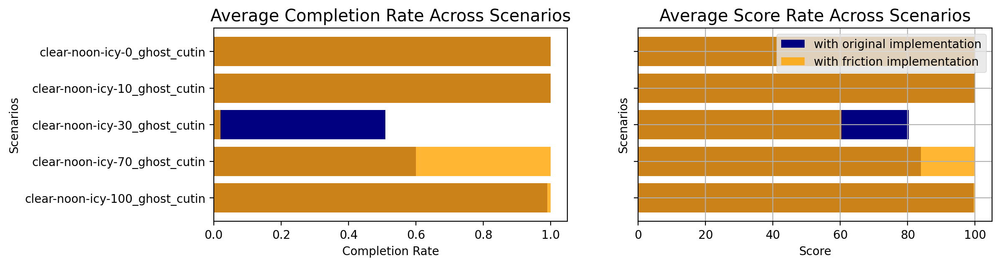

In [33]:
friction_legend = ["with original implementation", "with friction implementation"]

plt.subplots(1, 2, sharey=True, figsize=(12,3), dpi=200)
plt.gca().invert_yaxis()
width = 0.25

plt.subplot(1, 2, 1)
plt.style.use('ggplot')
plt.barh(subfolders, avg_complete_orig, label=friction_legend[0], color="navy")
plt.barh(subfolders, avg_complete_fric, label=friction_legend[1], color="orange" , alpha = 0.8)
plt.title('Average Completion Rate Across Scenarios')
plt.ylabel('Scenarios')
plt.xlabel('Completion Rate')


plt.subplot(1, 2, 2)
plt.style.use('ggplot')
plt.barh(subfolders, avg_score_orig, label=friction_legend[0], color="navy")
plt.barh(subfolders, avg_score_fric, label=friction_legend[1], color="orange" , alpha = 0.8)
plt.title('Average Score Rate Across Scenarios')
plt.ylabel('Scenarios')
plt.xlabel('Score')

plt.grid()

plt.legend()
plt.show()

## Comparison

In [34]:
attribute_order = ["x", "y", "v", "cvip", "steer", "brake", "throttle"]

all_medians = np.empty((len(txt_lists_fric), len(attribute_order), 2), dtype=object)
# [[[], []] * len(attribute_order)  for i in range(len(txt_lists_fric))]

all_medians

array([[[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]]], dtype=object)

In [35]:
full_legend = subfolders.copy()

### x,y traces

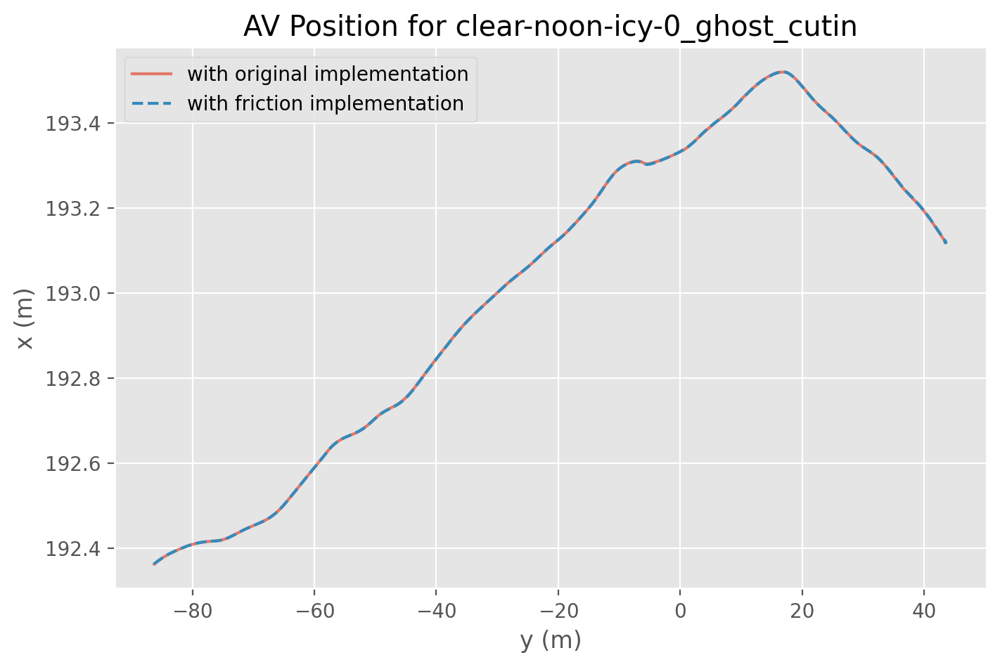

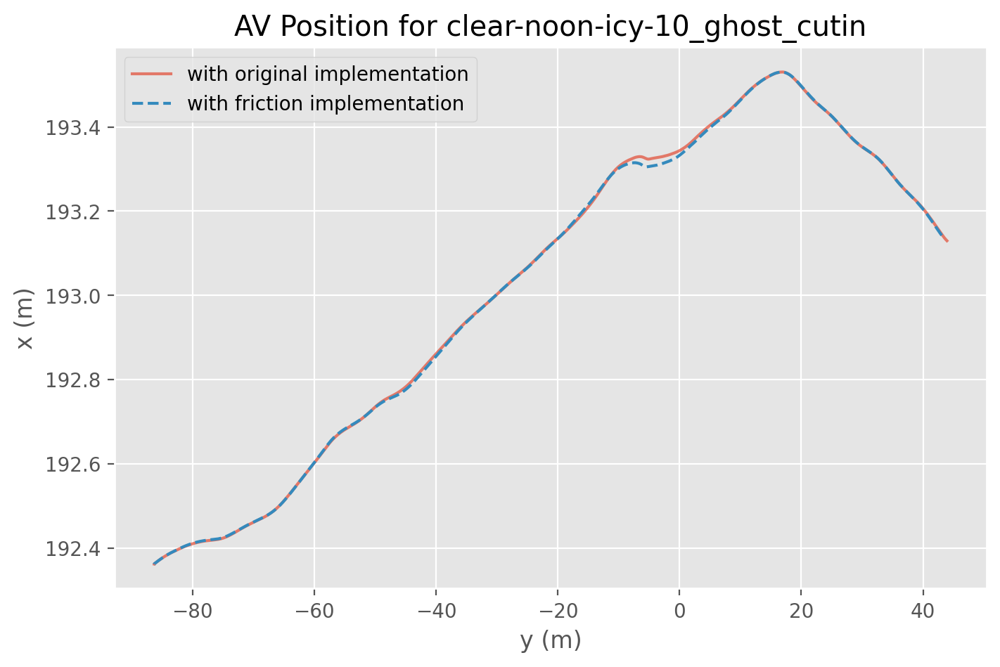

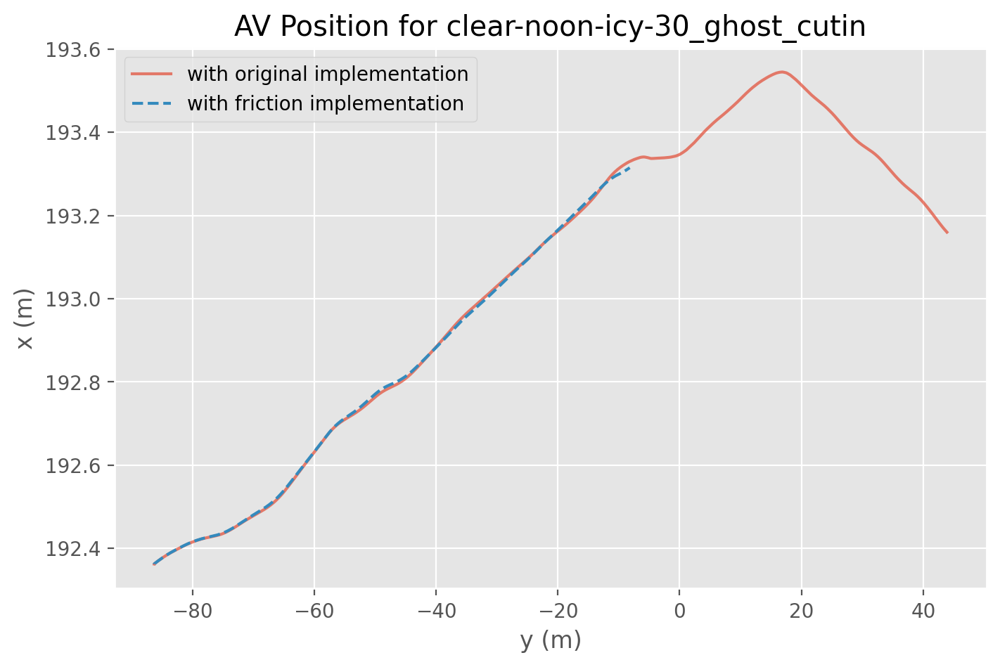

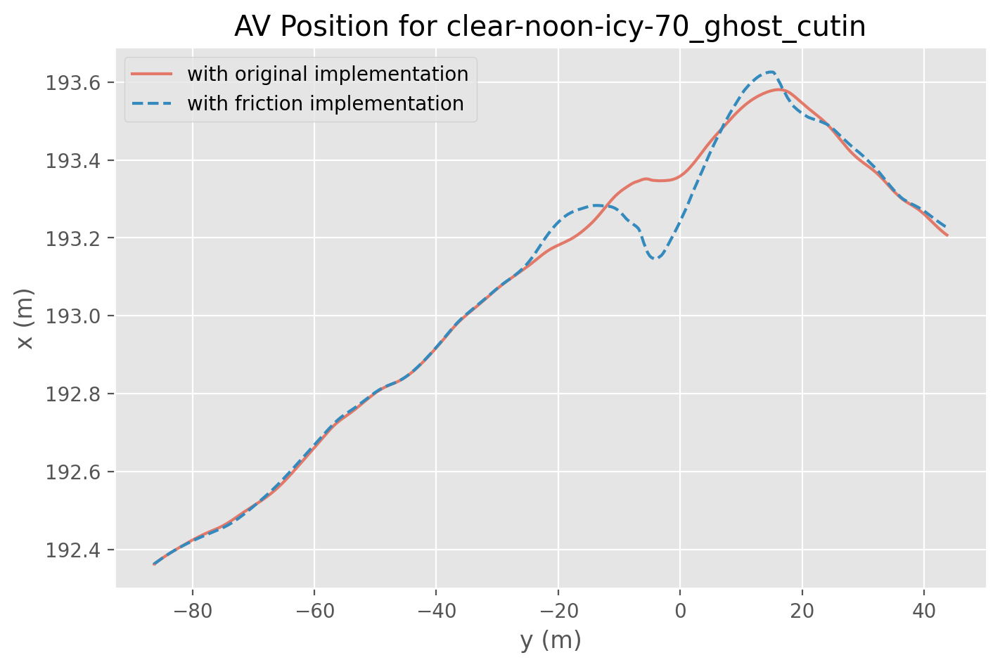

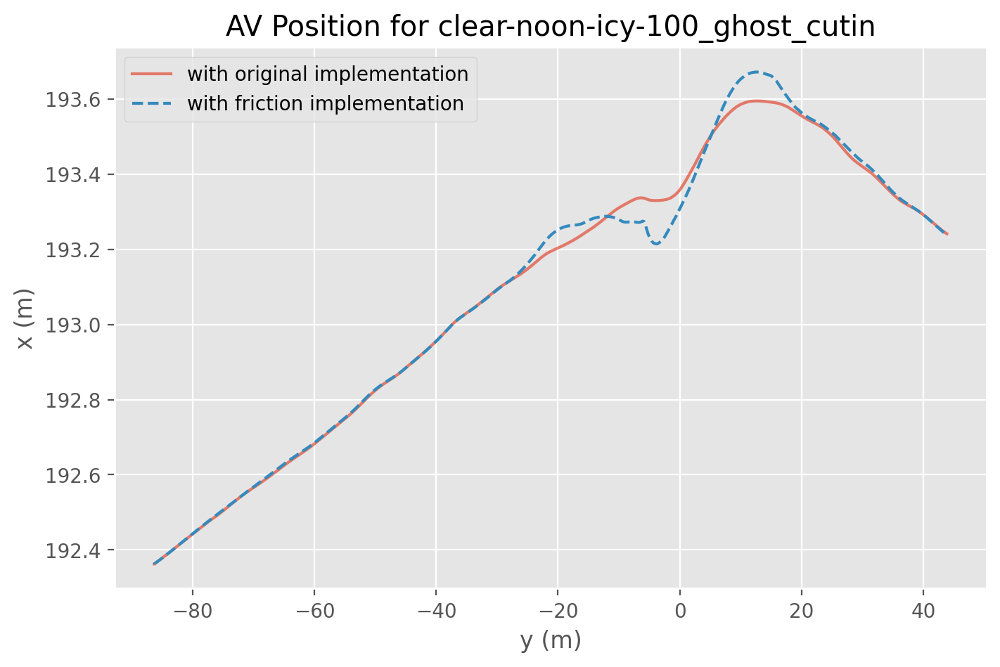

In [36]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_x = pd.DataFrame()
    df_orig_y = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['x'].dtypes == 'object' or df_array_orig[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['x'].isnull().values.any() and not df_array_orig[weather][i]['y'].isnull().values.any():
                df_orig_x["Run"+str(i)] = df_array_orig[weather][i]['x']
                df_orig_y["Run"+str(i)] = df_array_orig[weather][i]['y']

    median_orig_x = df_orig_x.median(axis=1)
    median_orig_y = df_orig_y.median(axis=1)

    plt.plot(median_orig_y, median_orig_x, alpha=0.7)


    df_fric_x = pd.DataFrame()
    df_fric_y = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['x'].dtypes == 'object' or df_array_fric[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['x'].isnull().values.any() and not df_array_fric[weather][i]['y'].isnull().values.any():
                df_fric_x["Run"+str(i)] = df_array_fric[weather][i]['x']
                df_fric_y["Run"+str(i)] = df_array_fric[weather][i]['y']

    median_fric_x = df_fric_x.median(axis=1)
    median_fric_y = df_fric_y.median(axis=1)

    
    all_medians[weather][0][0] = median_orig_x
    all_medians[weather][0][1] = median_fric_x
    all_medians[weather][1][0] = median_orig_y
    all_medians[weather][1][1] = median_fric_y
    
    plt.plot(median_fric_y, median_fric_x, '--')
    plt.xlabel("y (m)")
    plt.ylabel("x (m)")
    
    plt.title("AV Position for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

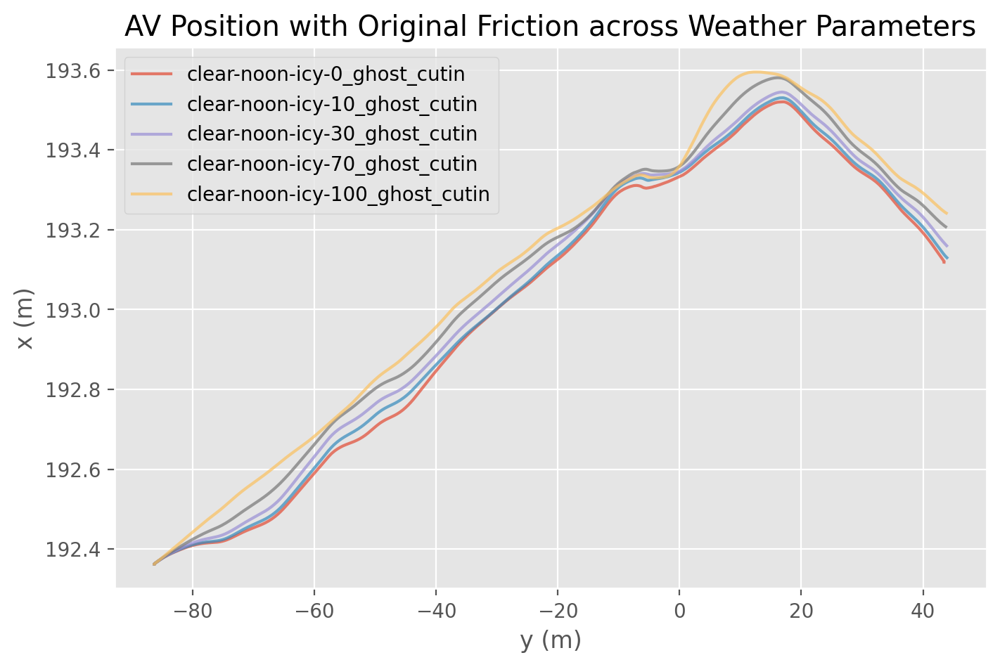

In [37]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    df_orig_x = pd.DataFrame()
    df_orig_y = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['x'].dtypes == 'object' or df_array_orig[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['x'].isnull().values.any() and not df_array_orig[weather][i]['y'].isnull().values.any():
                df_orig_x["Run"+str(i)] = df_array_orig[weather][i]['x']
                df_orig_y["Run"+str(i)] = df_array_orig[weather][i]['y']

    median_orig_x = df_orig_x.median(axis=1)
    median_orig_y = df_orig_y.median(axis=1)

    plt.plot(median_orig_y, median_orig_x, alpha=0.7)

    
# plt.axis('equal')
plt.xlabel("y (m)")
plt.ylabel("x (m)")
plt.title("AV Position with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

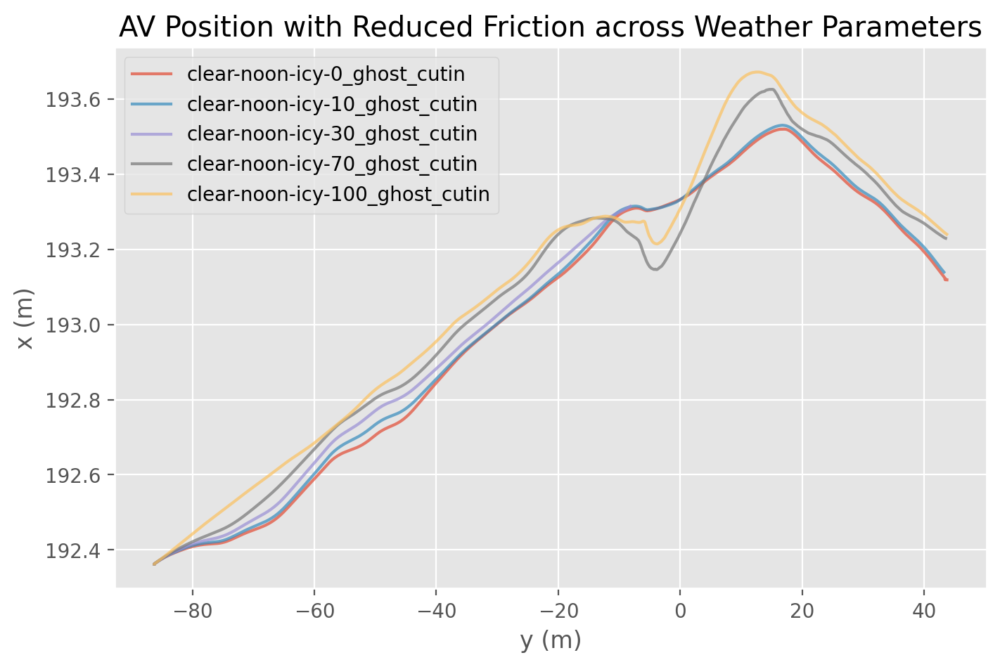

In [38]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_x = pd.DataFrame()
    df_fric_y = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['x'].dtypes == 'object' or df_array_fric[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['x'].isnull().values.any() and not df_array_fric[weather][i]['y'].isnull().values.any():
                df_fric_x["Run"+str(i)] = df_array_fric[weather][i]['x']
                df_fric_y["Run"+str(i)] = df_array_fric[weather][i]['y']

    median_fric_x = df_fric_x.median(axis=1)
    median_fric_y = df_fric_y.median(axis=1)

    plt.plot(median_fric_y, median_fric_x, alpha=0.7)
    
# plt.axis('equal')
plt.xlabel("y (m)")
plt.ylabel("x (m)")
plt.title("AV Position with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### v

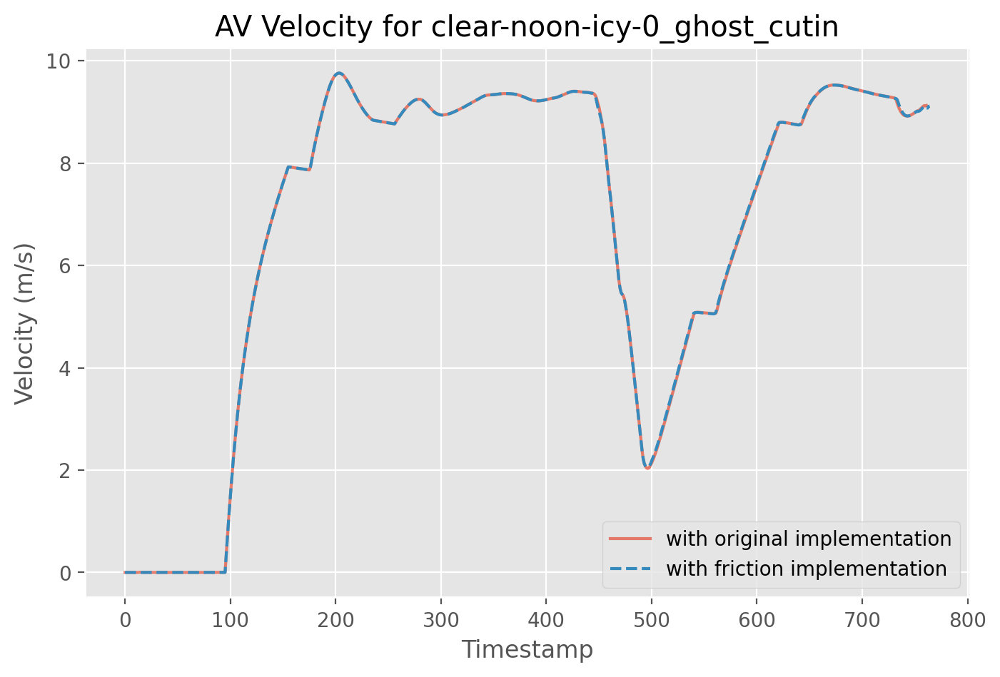

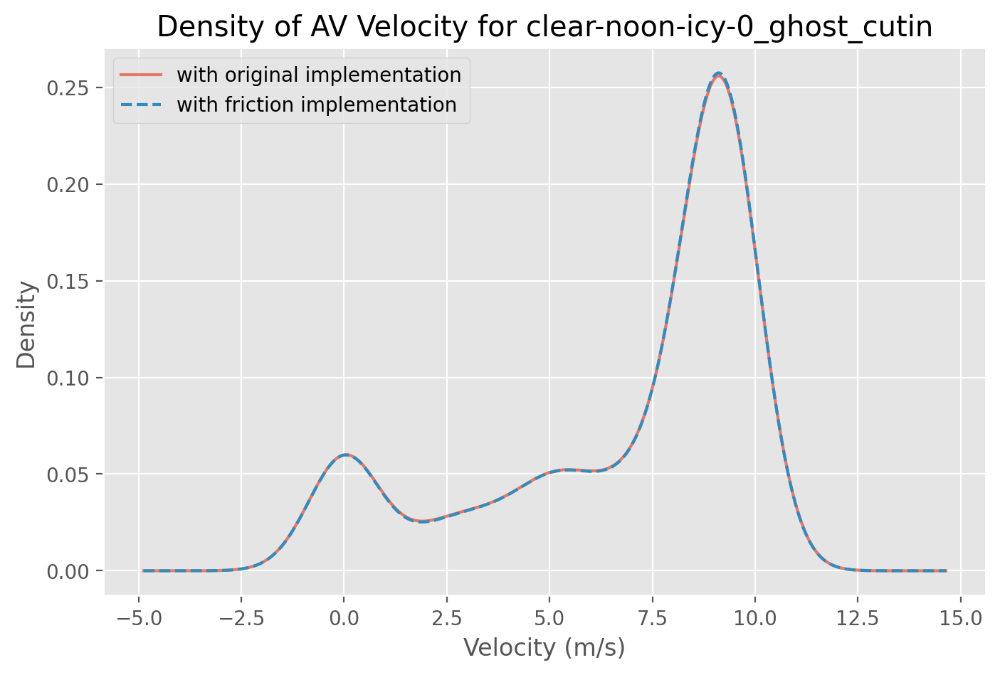

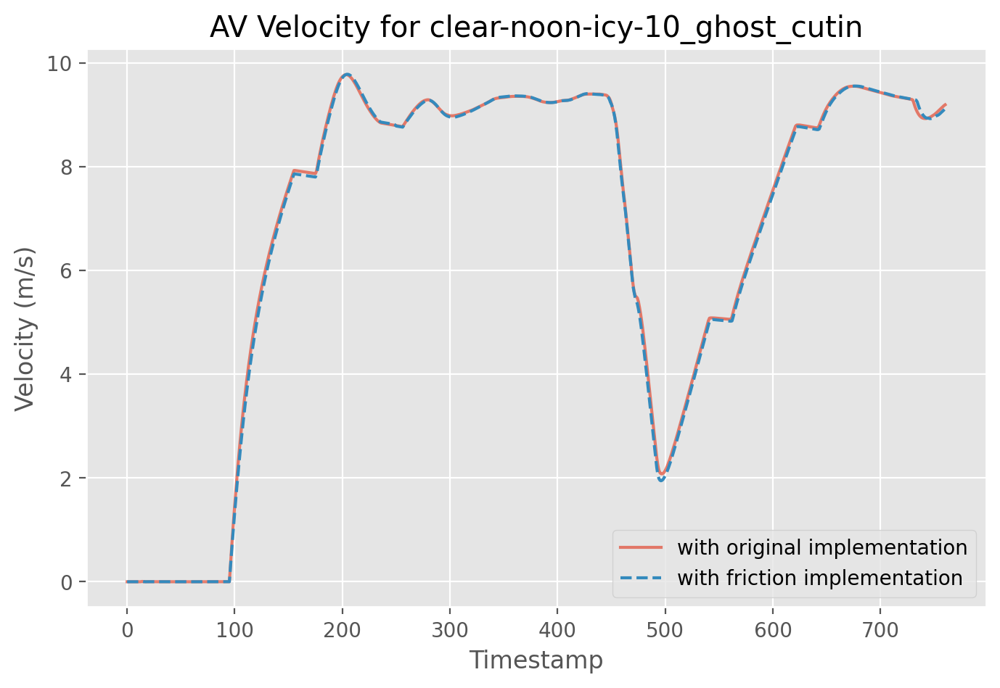

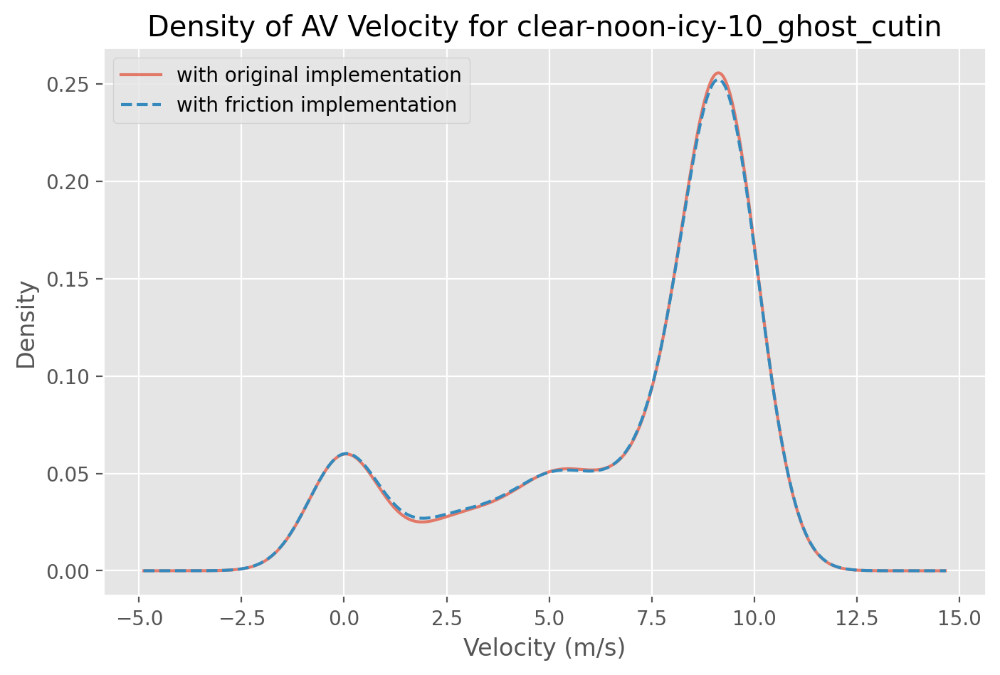

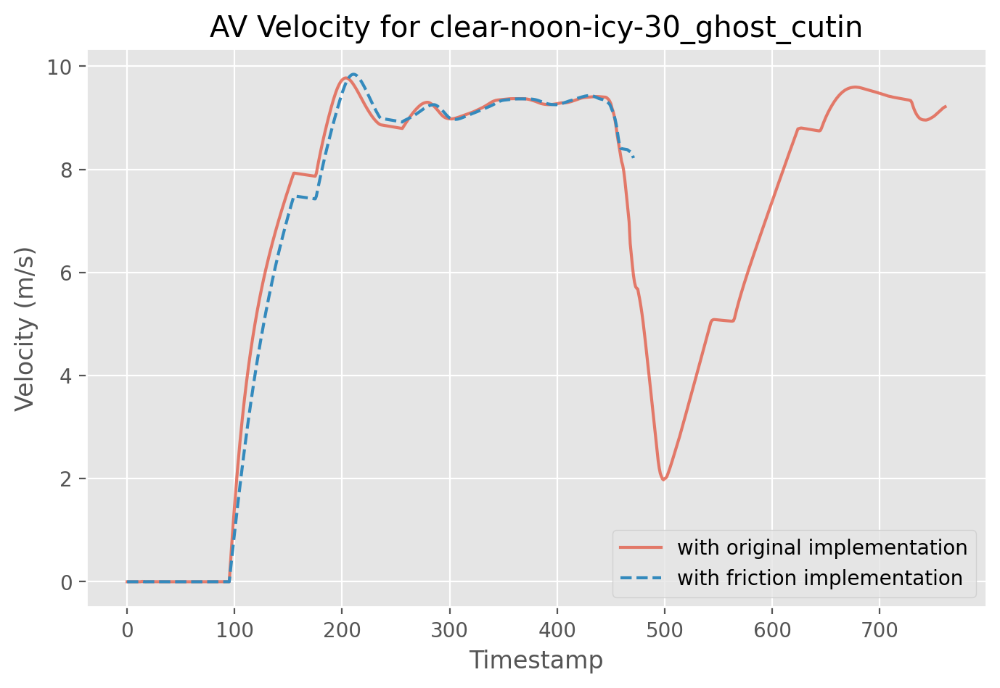

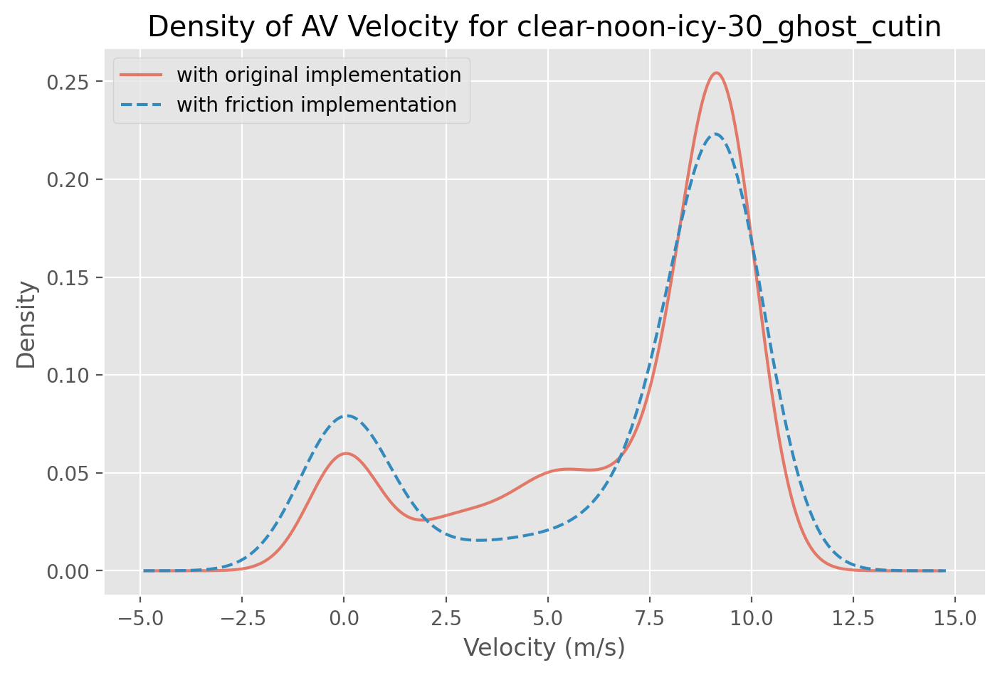

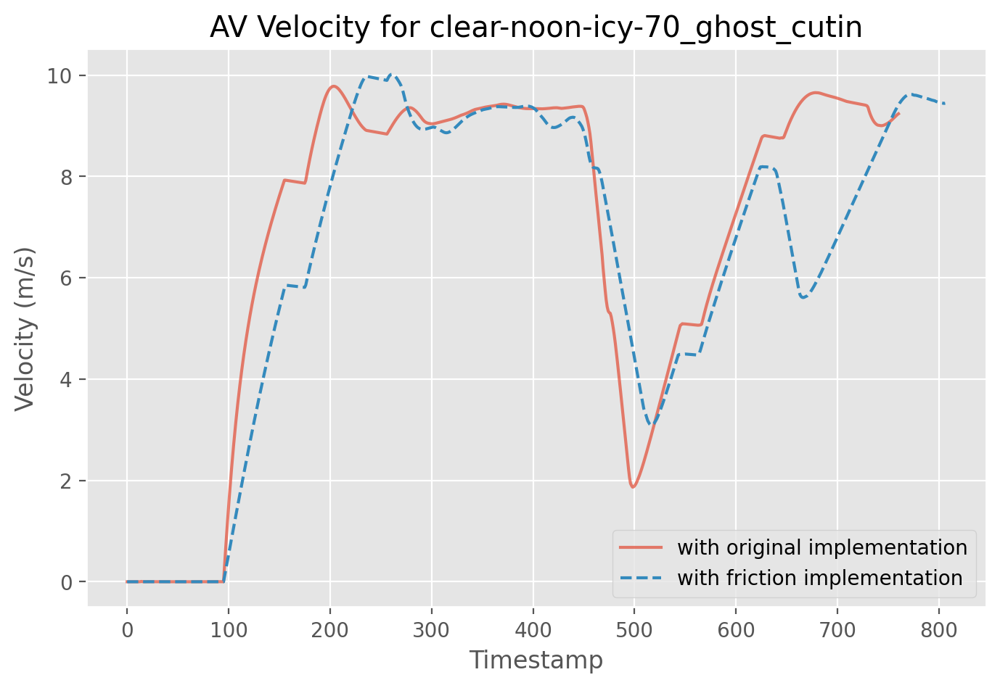

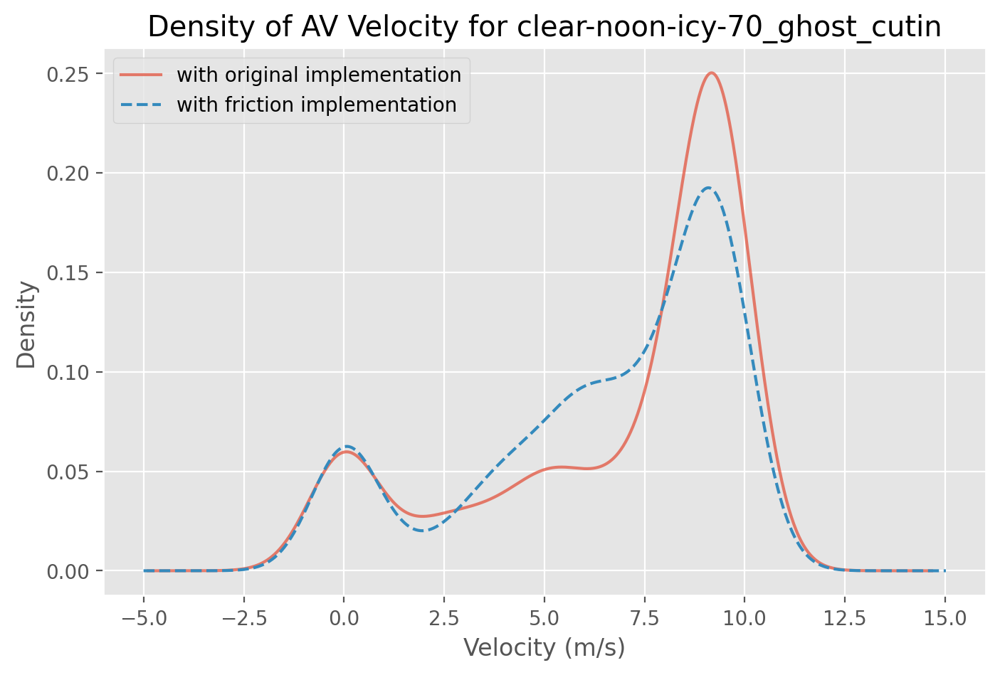

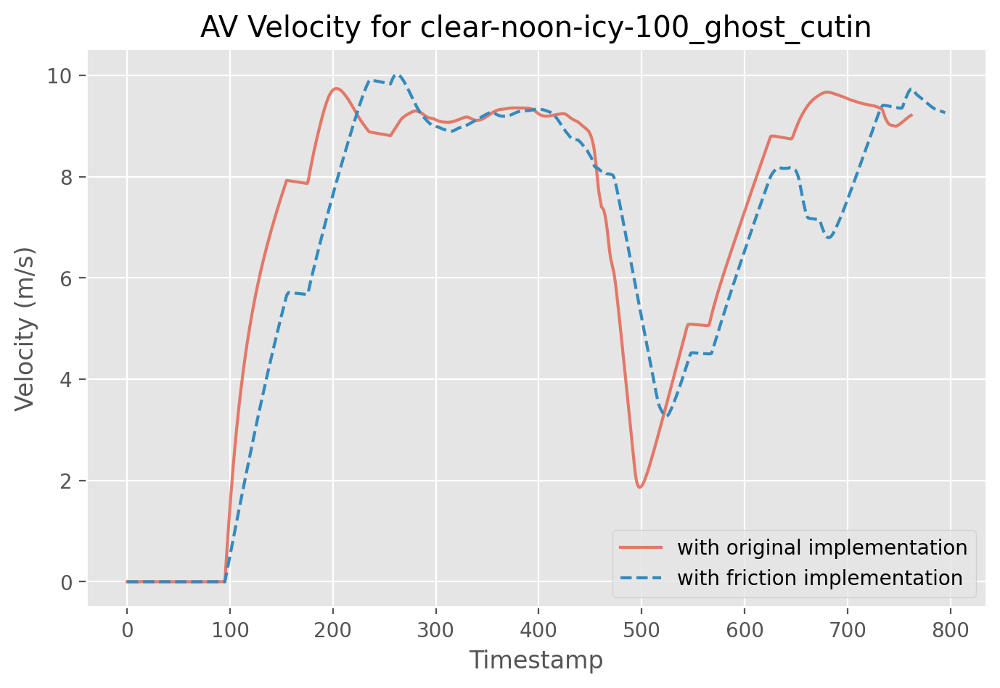

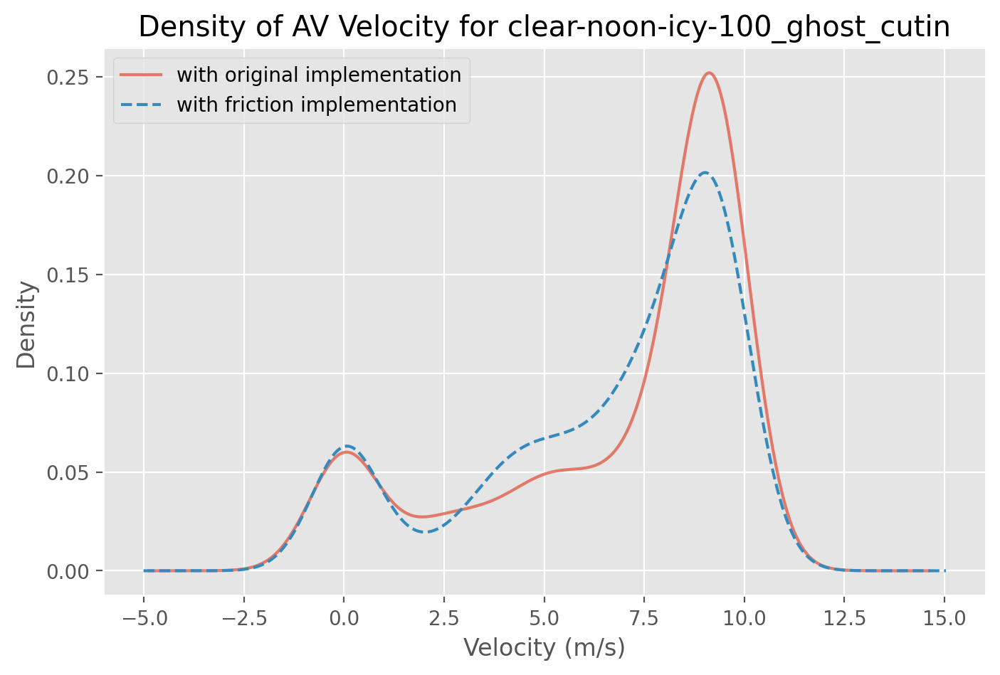

In [39]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_v = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['v'].isnull().values.any():
                df_orig_v["Run"+str(i)] = df_array_orig[weather][i]['v']

    median_orig_v = df_orig_v.median(axis=1)

    plt.plot(median_orig_v, alpha=0.7)


    df_fric_v = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['v'].isnull().values.any():
                df_fric_v["Run"+str(i)] = df_array_fric[weather][i]['v']

    median_fric_v = df_fric_v.median(axis=1)
    
    all_medians[weather][2][0] = median_orig_v
    all_medians[weather][2][1] = median_fric_v
    
    plt.plot(median_fric_v, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Velocity (m/s)")
    plt.title("AV Velocity for " + subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Velocity (m/s)")
    plt.ylabel("Density")
    median_orig_v.plot.density(alpha=0.7)
    median_fric_v.plot.density(style='--')
    plt.title("Density of AV Velocity for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

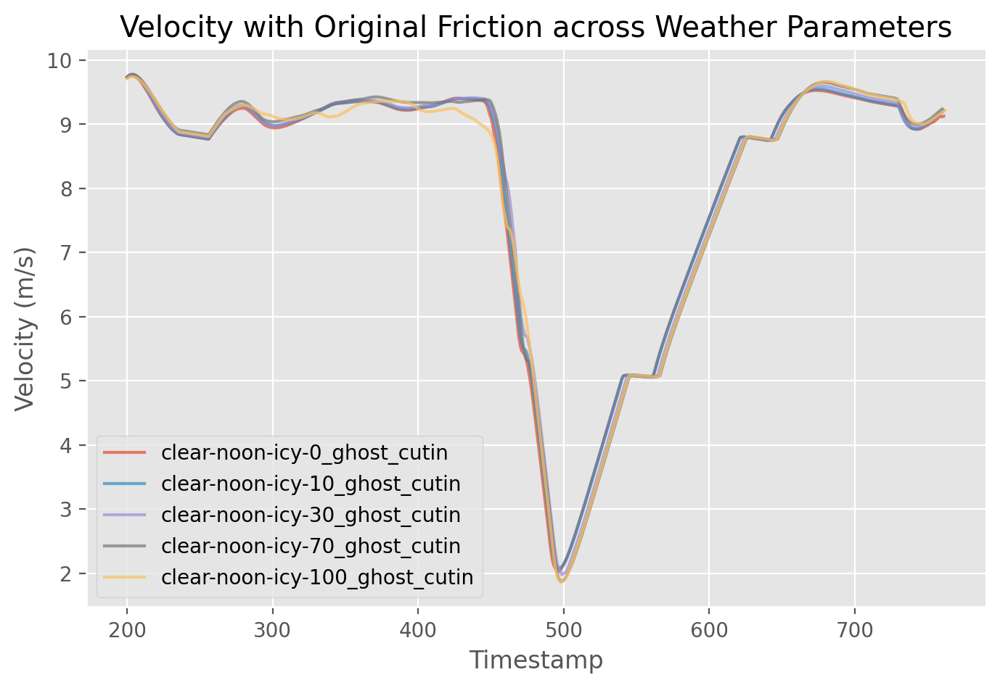

In [40]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_v = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['v'].dtypes == 'v'):
            print(i)
        else:
            if not df_array_orig[weather][i]['v'].isnull().values.any():
                df_orig_v["Run"+str(i)] = df_array_orig[weather][i]['v']

    median_orig_v = df_orig_v.median(axis=1)


    plt.plot(median_orig_v[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Velocity (m/s)")
plt.title("Velocity with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

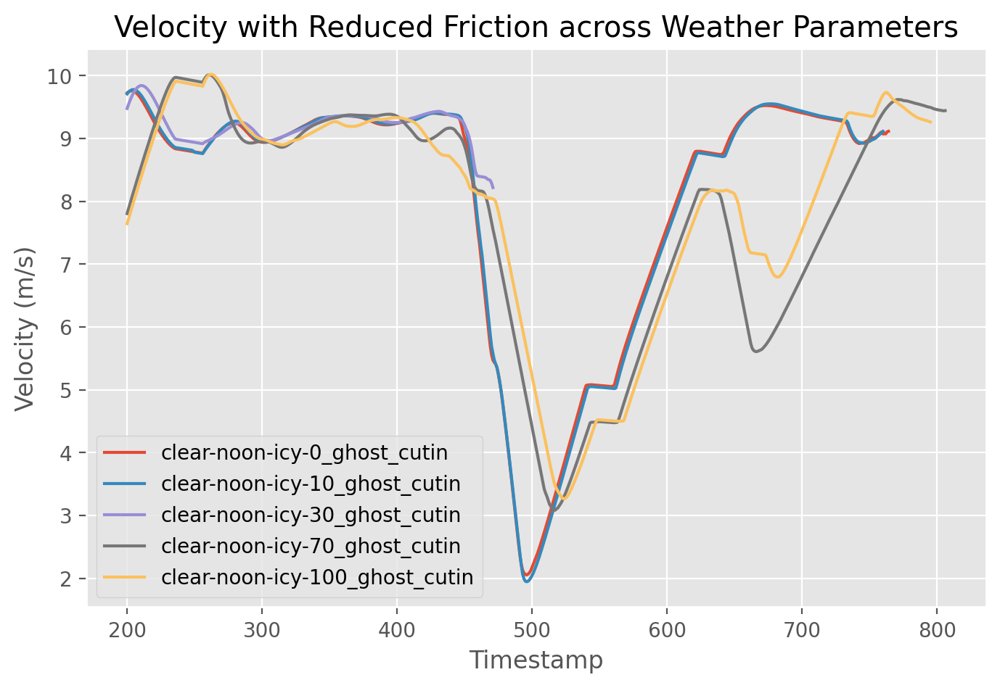

In [41]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_v = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['v'].isnull().values.any() :
                df_fric_v["Run"+str(i)] = df_array_fric[weather][i]['v']

    median_fric_v = df_fric_v.median(axis=1)

    plt.plot(median_fric_v[200:])

    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("Velocity (m/s)")
plt.title("Velocity with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### cvip

0      500.497261
1        5.598742
2        5.595580
3        5.592744
4        5.590235
          ...    
760     48.755854
761     49.093795
762     49.503699
763     49.658728
764     49.821800
Length: 765, dtype: float64


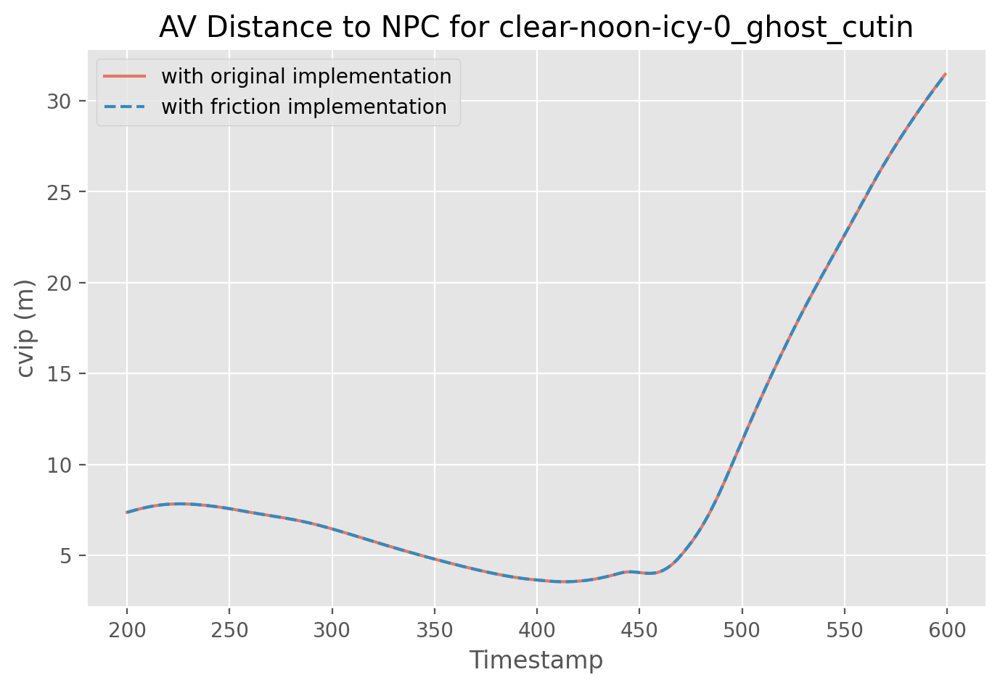

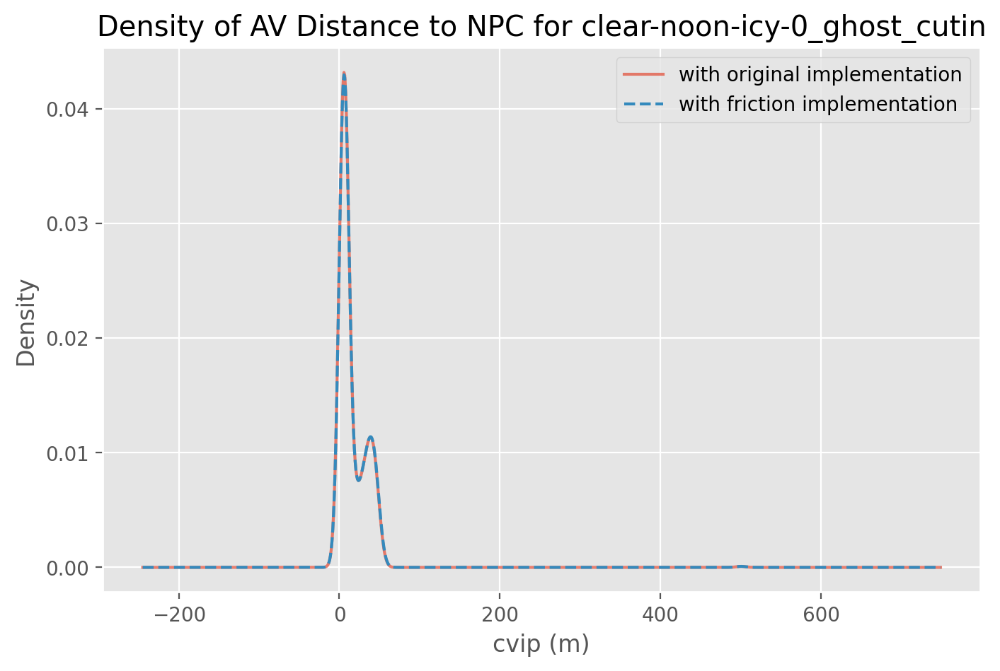

0      500.497261
1        5.598742
2        5.595580
3        5.592744
4        5.590235
          ...    
756     48.194366
757     48.300589
758     48.406468
759     48.512856
760     48.634106
Length: 761, dtype: float64


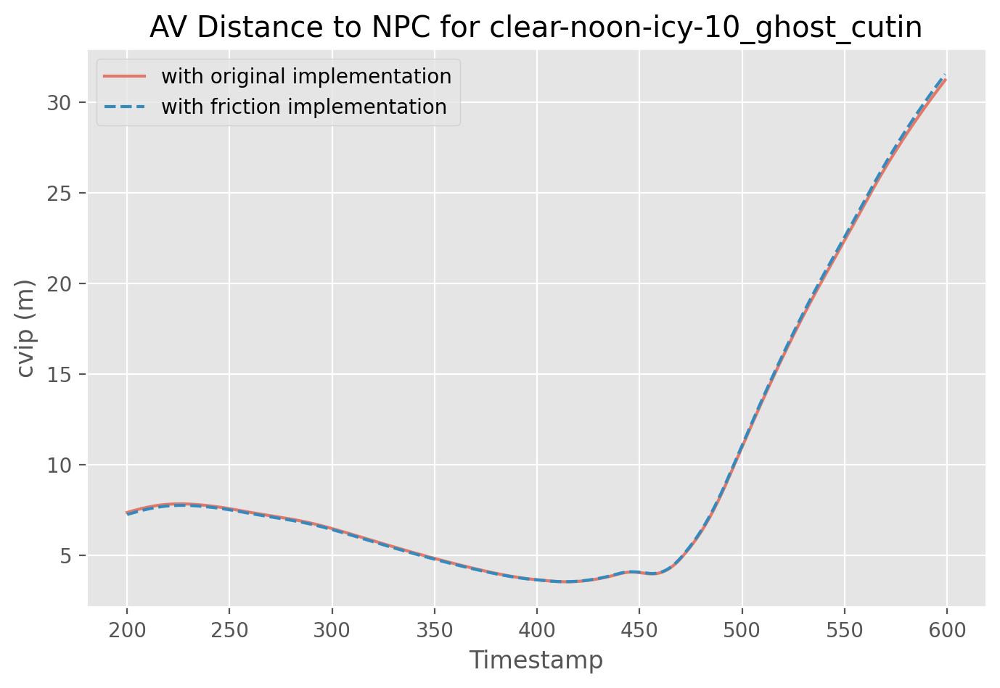

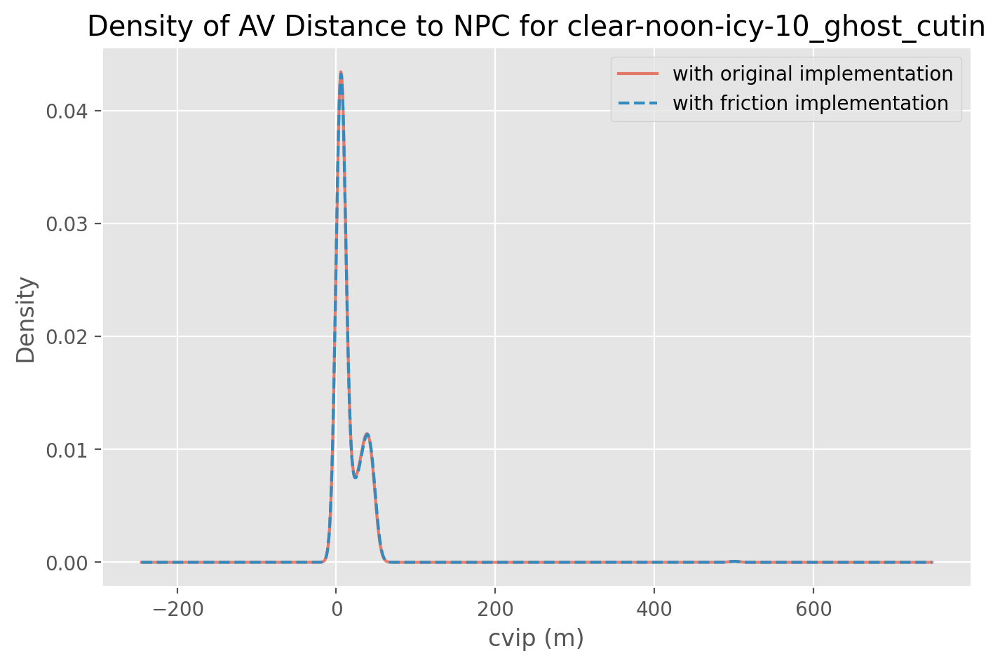

0      500.497261
1        5.598742
2        5.595580
3        5.592744
4        5.590235
          ...    
467      4.209630
468      4.226048
469      4.244690
470      4.266472
471      4.293547
Length: 472, dtype: float64


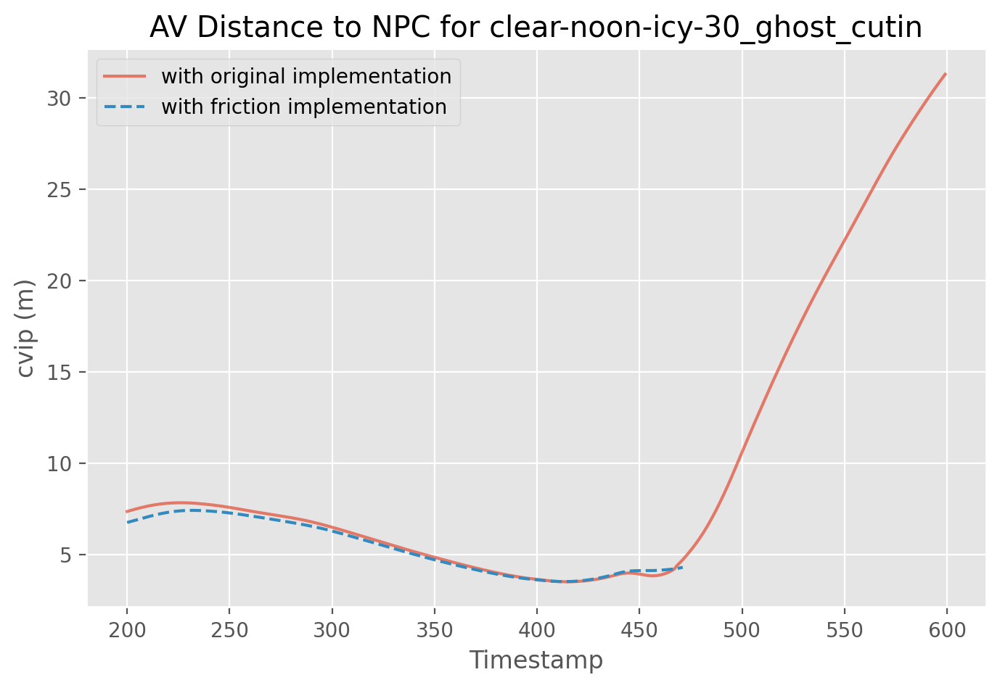

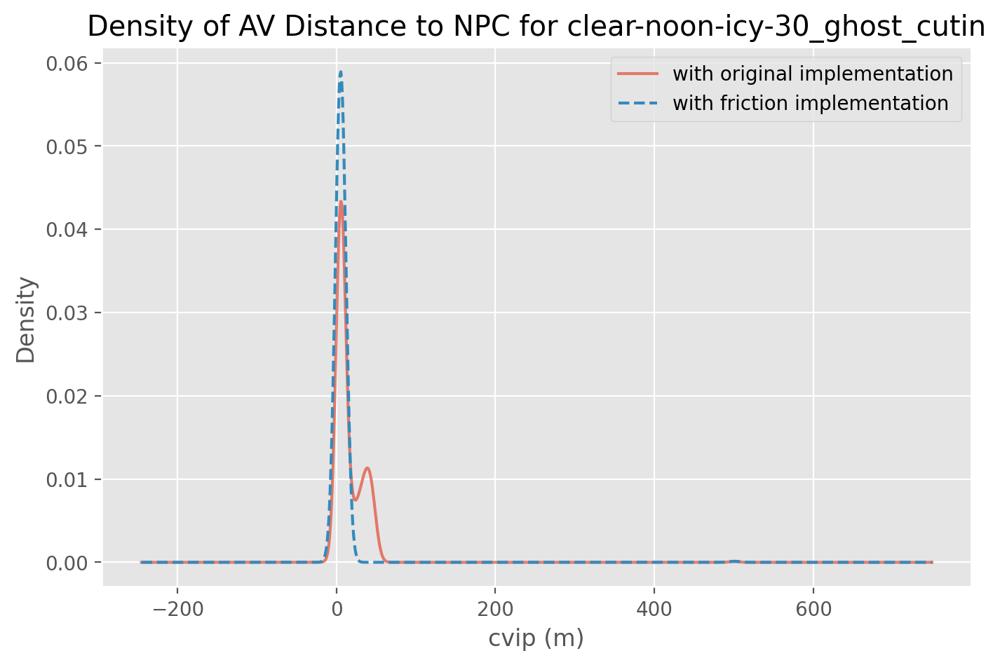

0      500.497261
1        5.598742
2        5.595580
3        5.592744
4        5.590235
          ...    
802     19.219707
803     19.335005
804     19.444367
805     19.533033
806     19.582716
Length: 807, dtype: float64


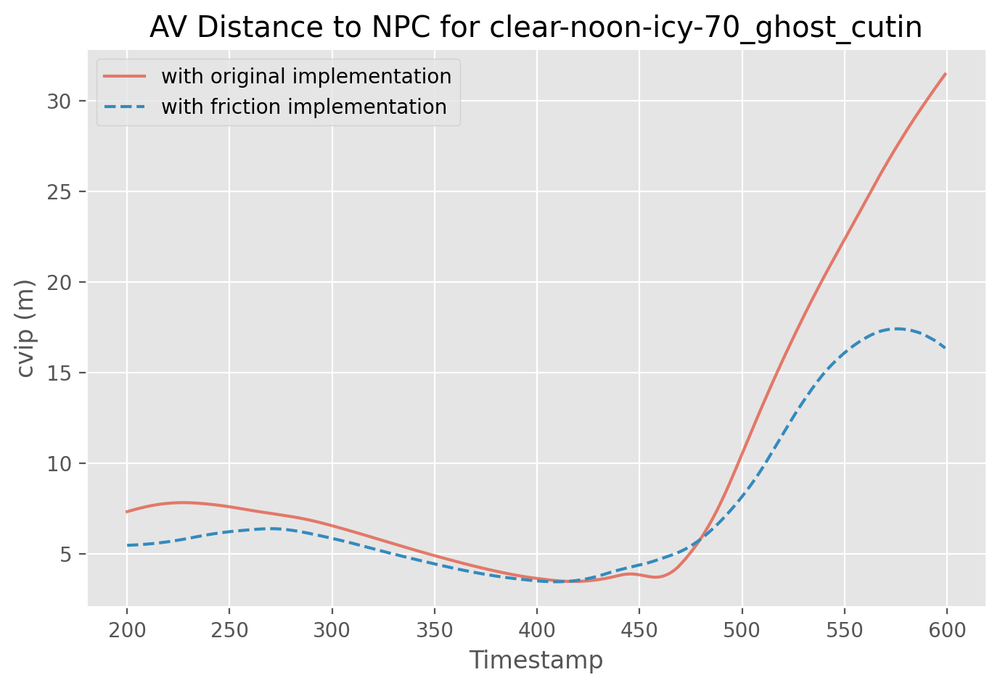

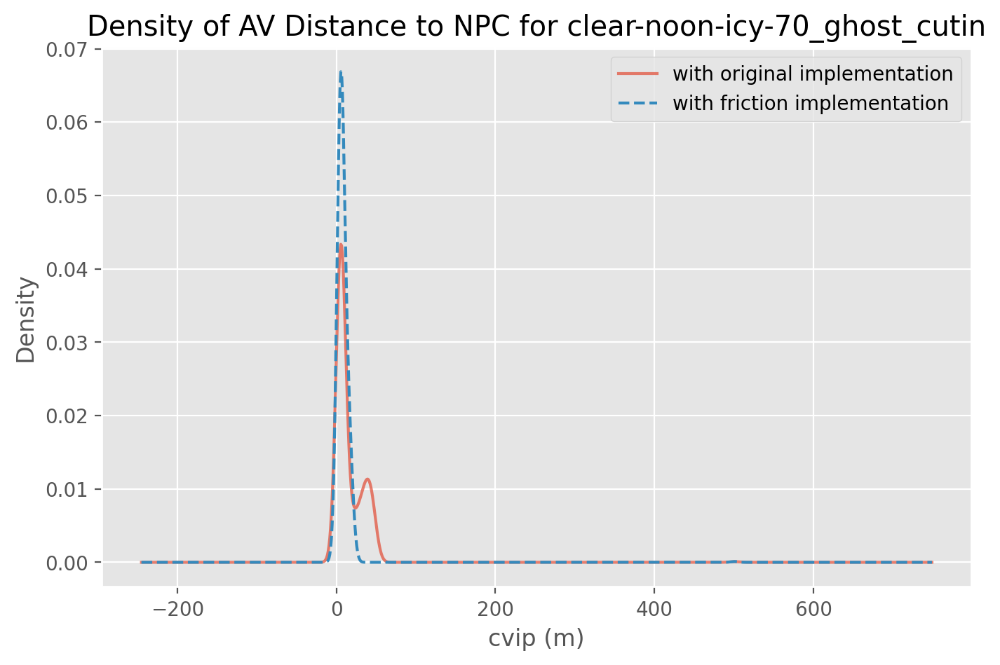

0      500.497261
1        5.598742
2        5.595580
3        5.592744
4        5.590235
          ...    
791     21.130219
792     21.302319
793     21.472602
794     21.635370
795     21.781797
Length: 796, dtype: float64


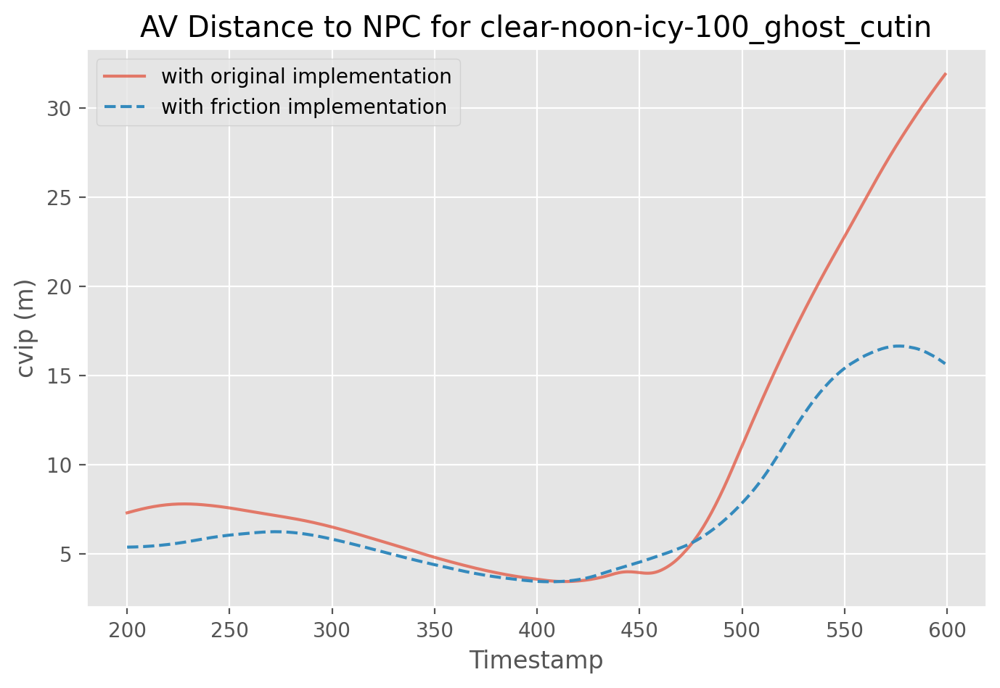

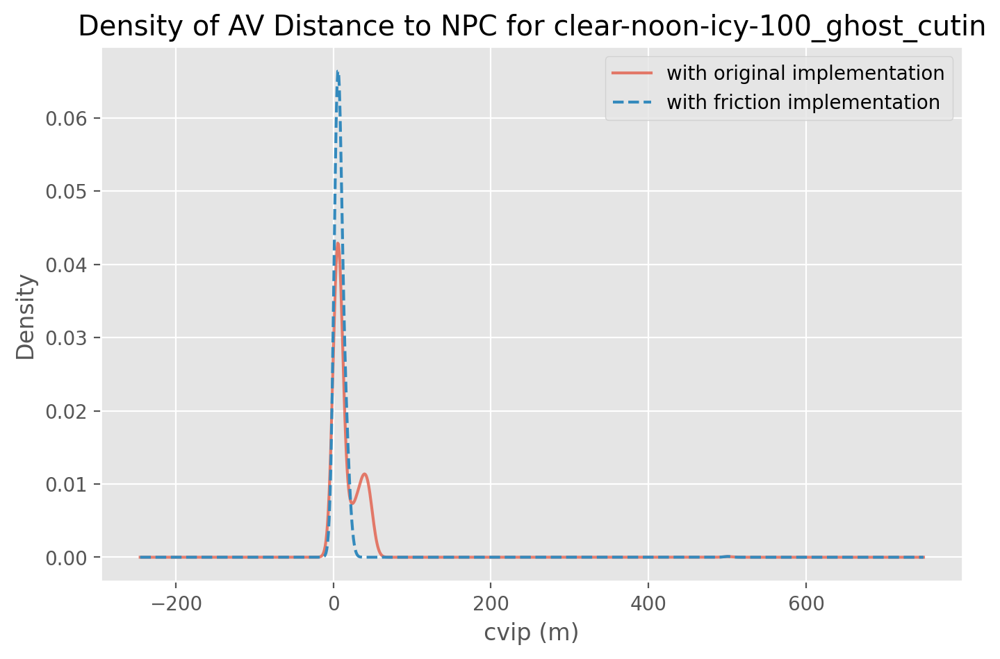

In [42]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_cvip = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['cvip'].isnull().values.any():
                df_orig_cvip["Run"+str(i)] = df_array_orig[weather][i]['cvip']

    median_orig_cvip = df_orig_cvip.median(axis=1)

    plt.plot(median_orig_cvip.iloc[200:600], alpha=0.7)


    df_fric_cvip = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['cvip'].isnull().values.any():
                df_fric_cvip["Run"+str(i)] = df_array_fric[weather][i]['cvip']

    median_fric_cvip = df_fric_cvip.median(axis=1)
    
    print(median_fric_cvip)
    
    all_medians[weather][3][0] = median_orig_cvip
    all_medians[weather][3][1] = median_fric_cvip
    
    plt.plot(median_fric_cvip.iloc[200:600], '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("cvip (m)")
    plt.title("AV Distance to NPC for " + subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("cvip (m)")
    plt.ylabel("Density")
    median_orig_cvip.plot.density(alpha=0.7)
    median_fric_cvip.plot.density(style='--')
    plt.title("Density of AV Distance to NPC for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()

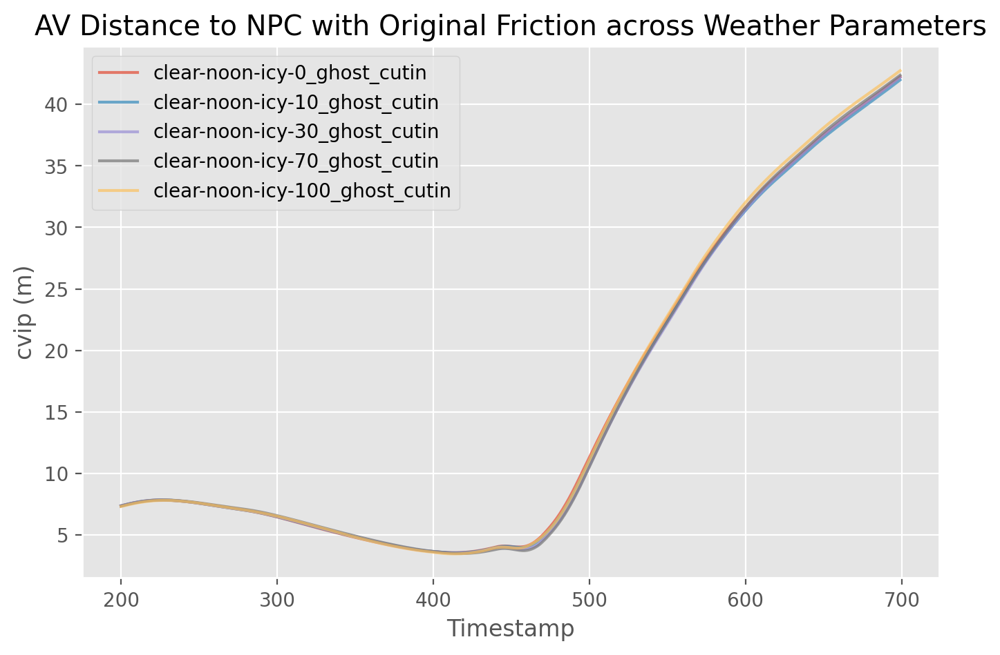

In [43]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_cvip = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['cvip'].isnull().values.any():
                df_orig_cvip["Run"+str(i)] = df_array_orig[weather][i]['cvip']

    median_orig_cvip = df_orig_cvip.median(axis=1)


    plt.plot(median_orig_cvip[200:700], alpha=0.7)



    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("cvip (m)")
plt.title("AV Distance to NPC with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

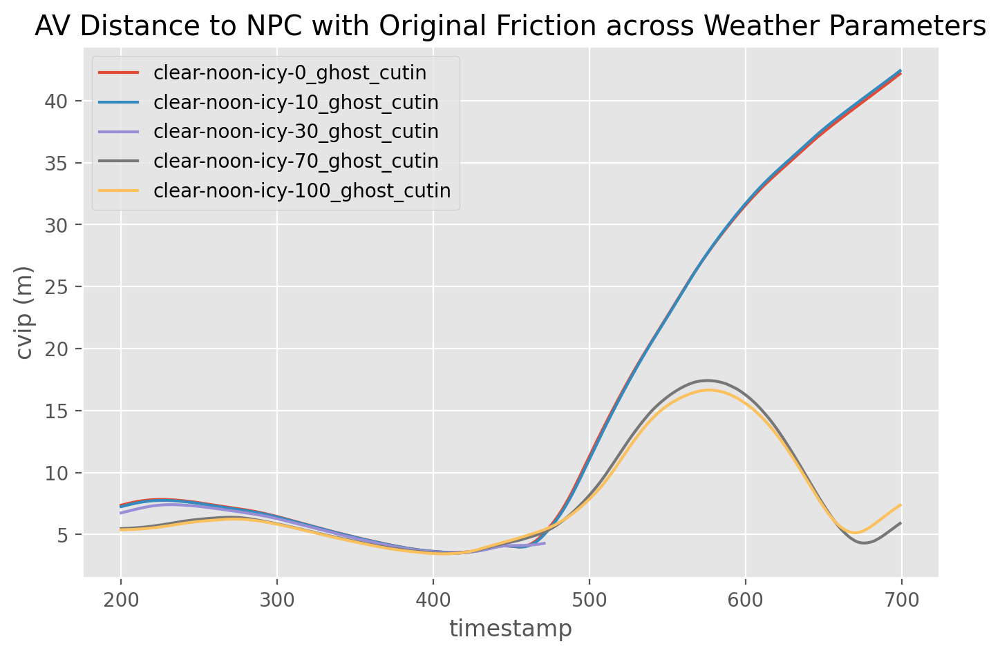

In [44]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_fric_cvip = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['cvip'].isnull().values.any() :
                df_fric_cvip["Run"+str(i)] = df_array_fric[weather][i]['cvip']

    median_fric_cvip = df_fric_cvip.median(axis=1)

    plt.plot(median_fric_cvip[200:700])

    # plt.axis('equal')
plt.xlabel("timestamp")
plt.ylabel("cvip (m)")
plt.title("AV Distance to NPC with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### steer

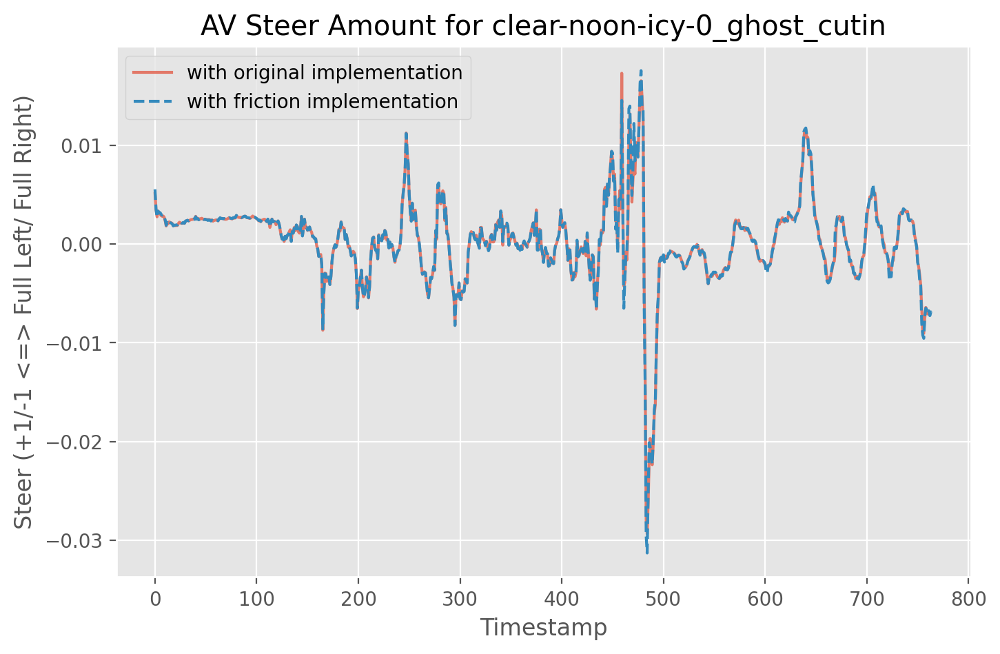

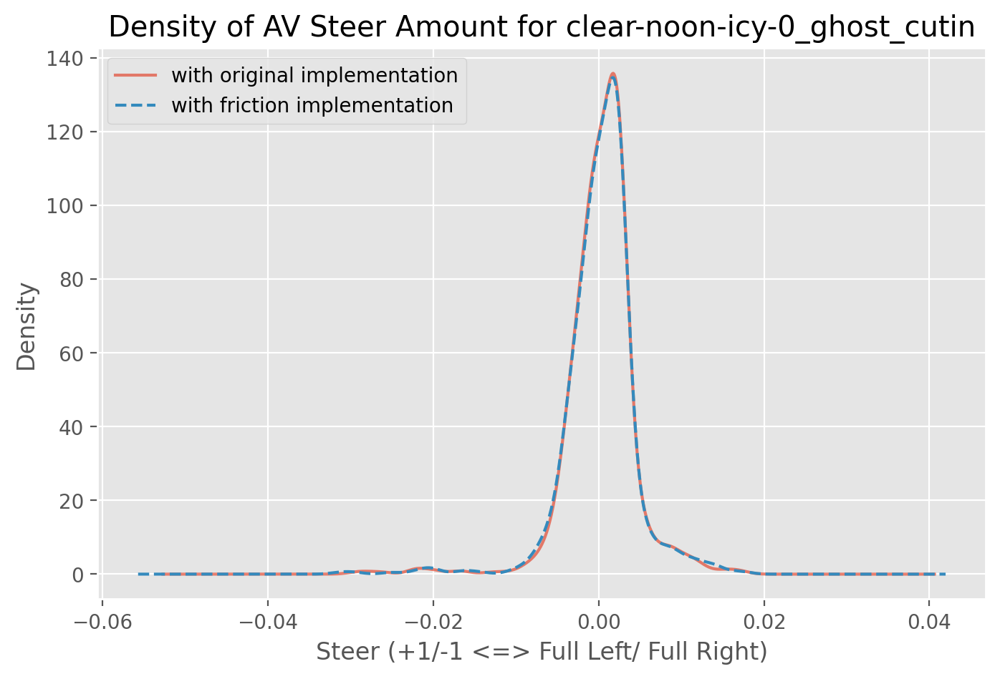

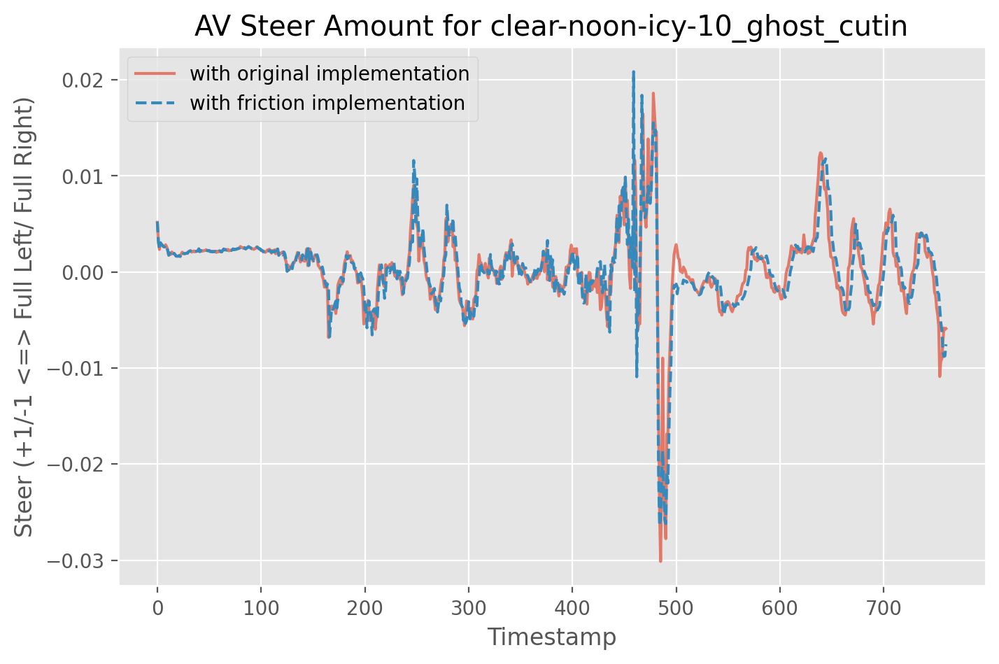

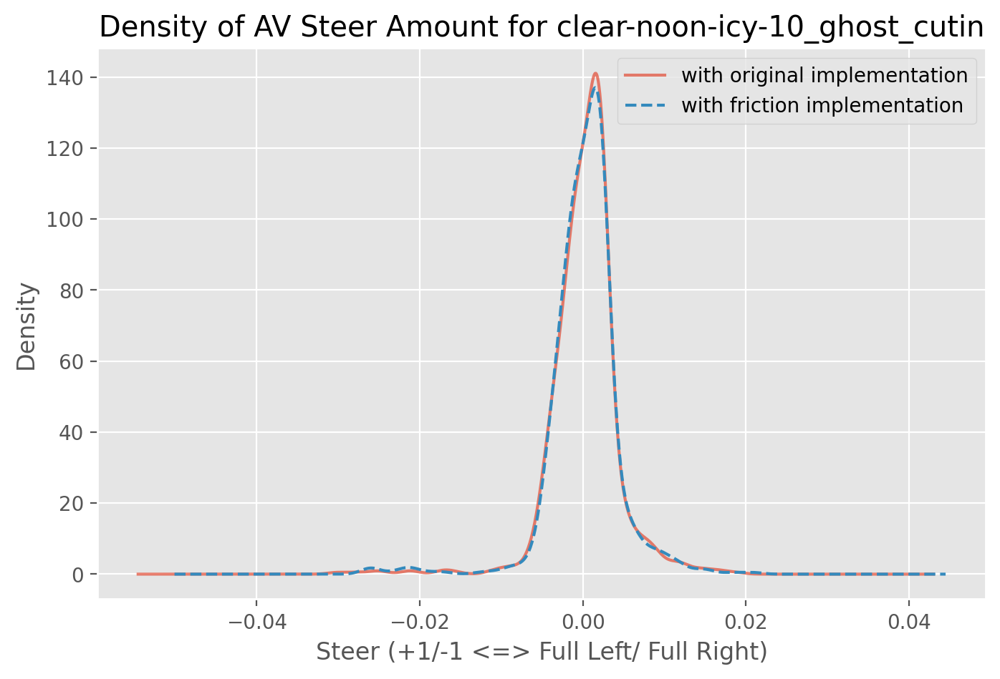

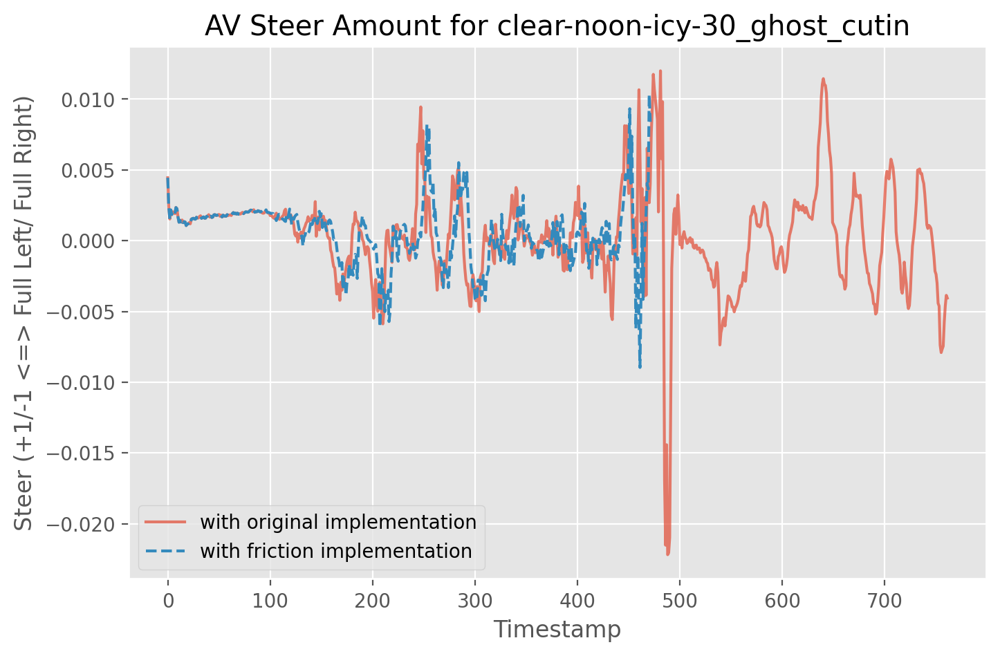

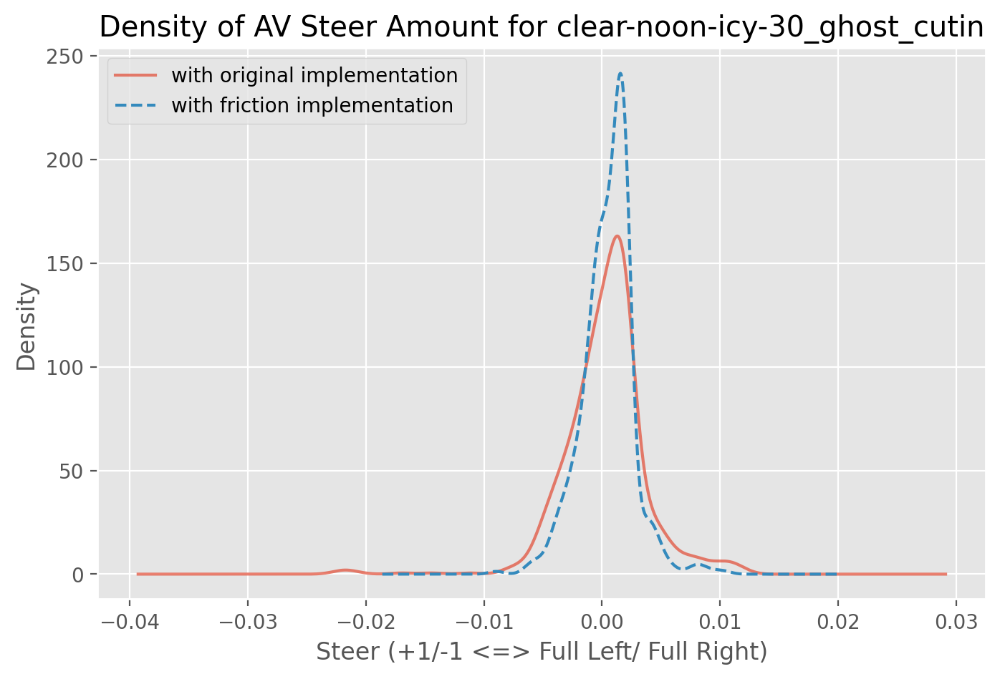

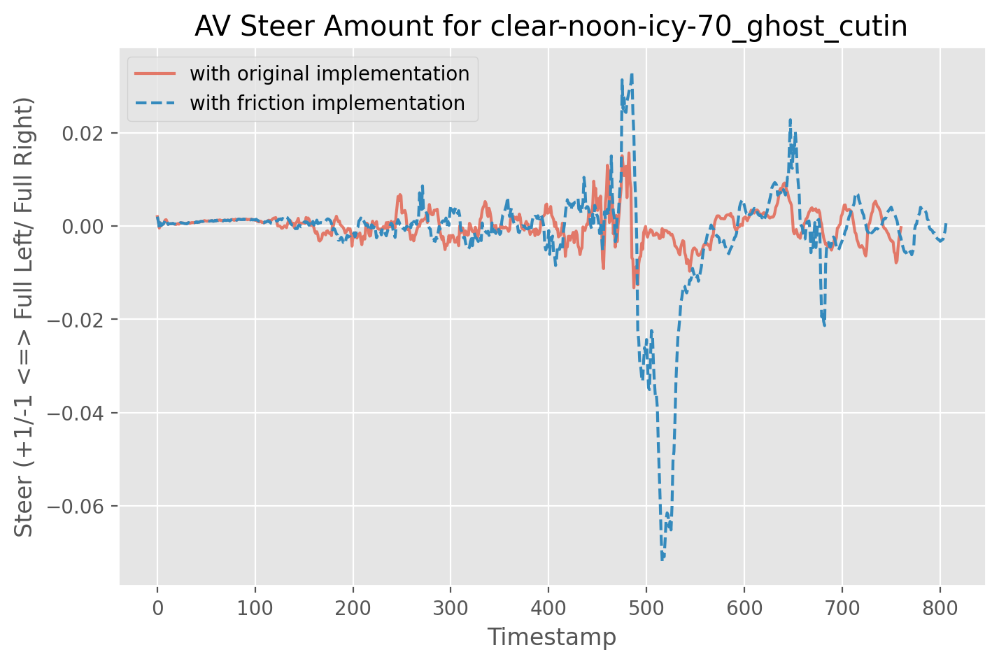

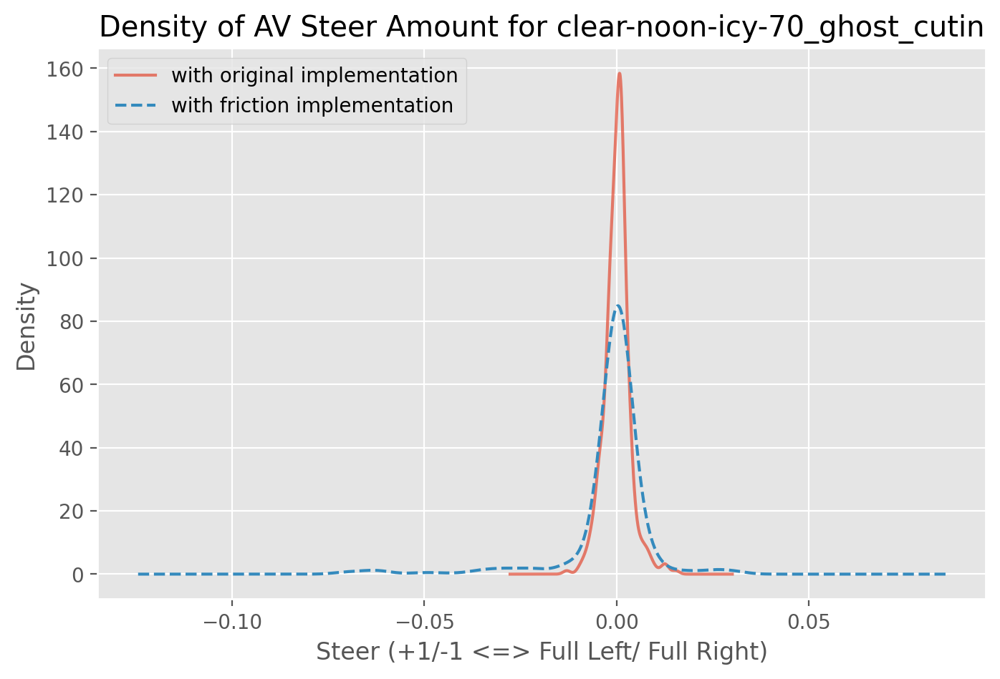

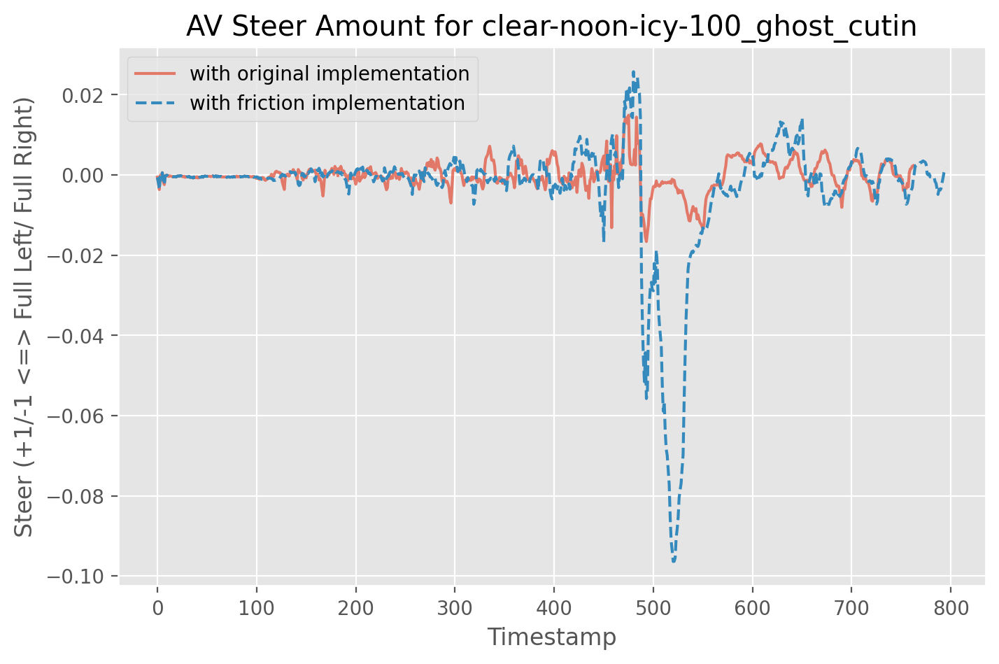

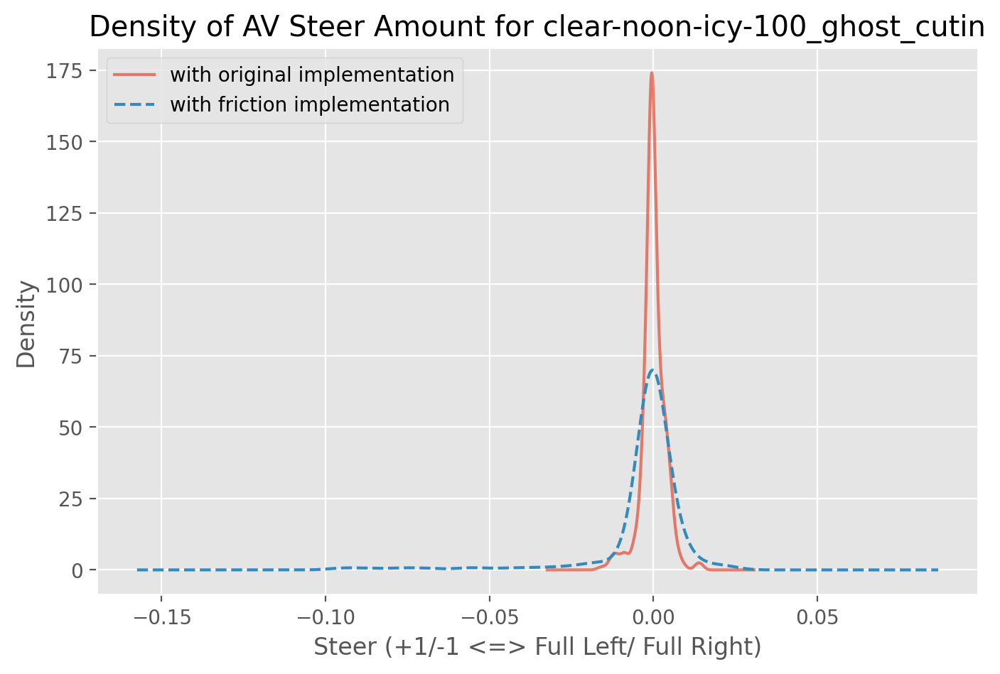

In [45]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_steer = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['steer'].isnull().values.any():
                df_orig_steer["Run"+str(i)] = df_array_orig[weather][i]['steer']

    median_orig_steer = df_orig_steer.median(axis=1)

    plt.plot(median_orig_steer, alpha=0.7)


    df_fric_steer = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['steer'].isnull().values.any():
                df_fric_steer["Run"+str(i)] = df_array_fric[weather][i]['steer']

    median_fric_steer = df_fric_steer.median(axis=1)
    
    all_medians[weather][4][0] = median_orig_steer
    all_medians[weather][4][1] = median_fric_steer
    
    plt.plot(median_fric_steer, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Steer (+1/-1 <=> Full Left/ Full Right)")
    plt.title("AV Steer Amount for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Steer (+1/-1 <=> Full Left/ Full Right)")
    plt.ylabel("Density")
    median_orig_steer.plot.density(alpha=0.7)
    median_fric_steer.plot.density(style='--')
    plt.title("Density of AV Steer Amount for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()

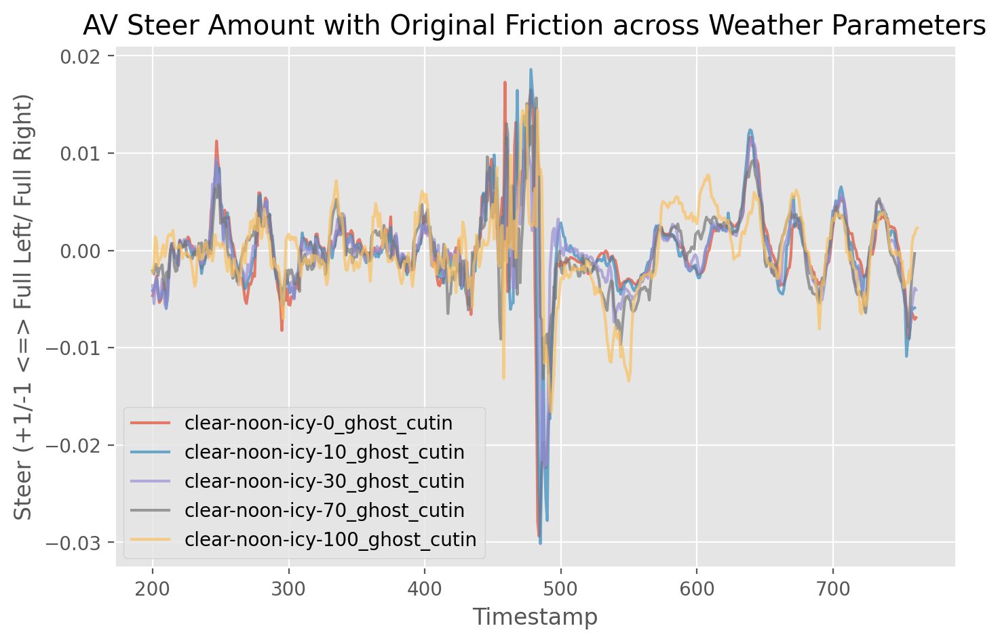

In [46]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_steer = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['steer'].dtypes == 'steer'):
            print(i)
        else:
            if not df_array_orig[weather][i]['steer'].isnull().values.any():
                df_orig_steer["Run"+str(i)] = df_array_orig[weather][i]['steer']

    median_orig_steer = df_orig_steer.median(axis=1)


    plt.plot(median_orig_steer[200:], alpha=0.7)

plt.xlabel("Timestamp")
plt.ylabel("Steer (+1/-1 <=> Full Left/ Full Right)")
plt.title("AV Steer Amount with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

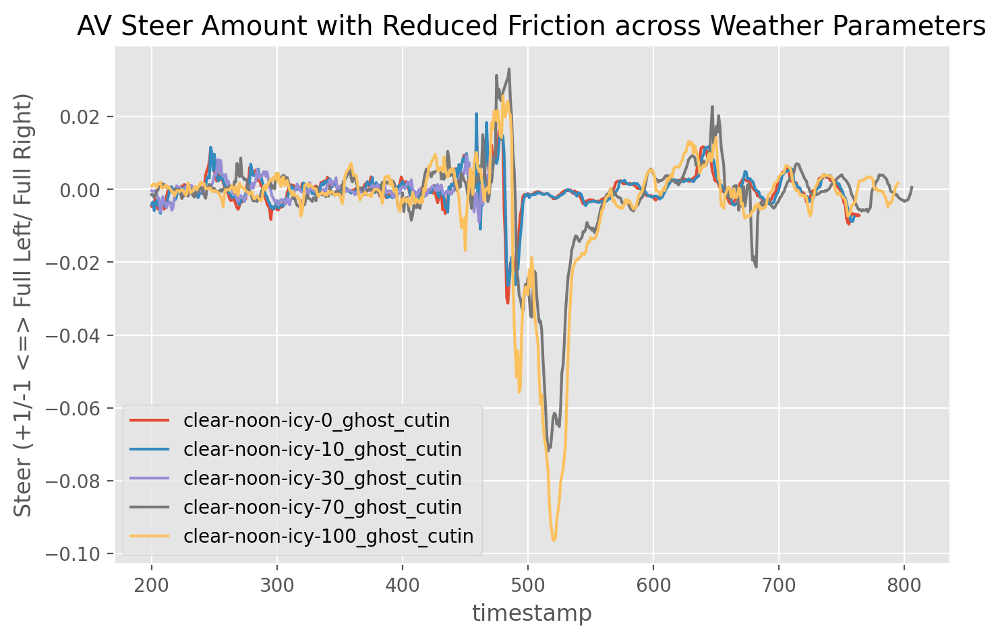

In [47]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_steer = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['steer'].isnull().values.any() :
                df_fric_steer["Run"+str(i)] = df_array_fric[weather][i]['steer']

    median_fric_steer = df_fric_steer.median(axis=1)

    plt.plot(median_fric_steer[200:])

    # plt.axis('equal')
plt.xlabel("timestamp")
plt.ylabel("Steer (+1/-1 <=> Full Left/ Full Right)")
plt.title("AV Steer Amount with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### brake

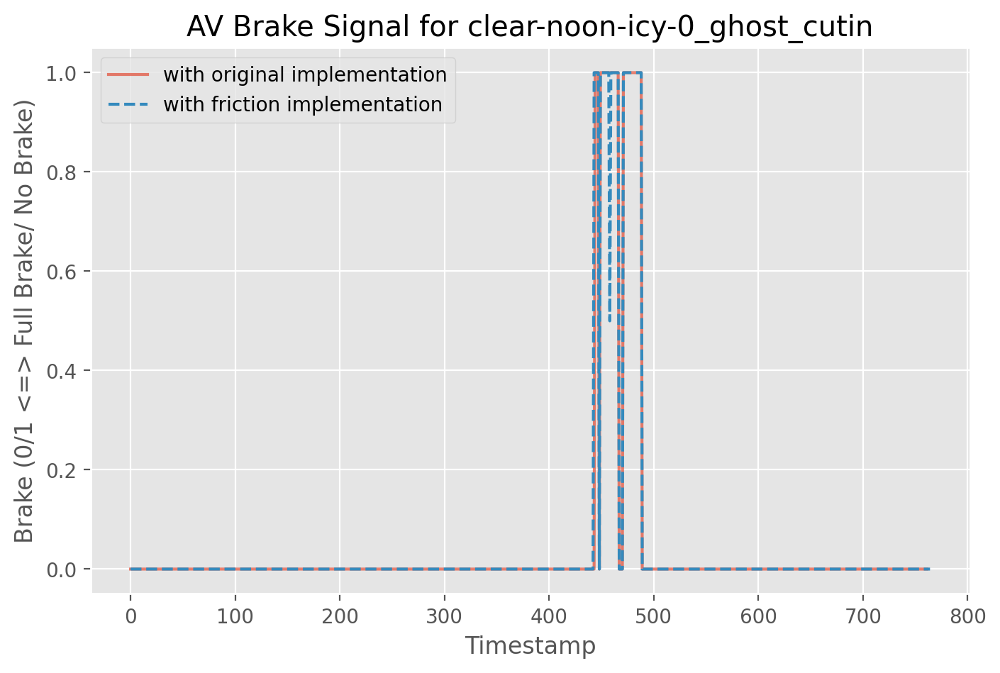

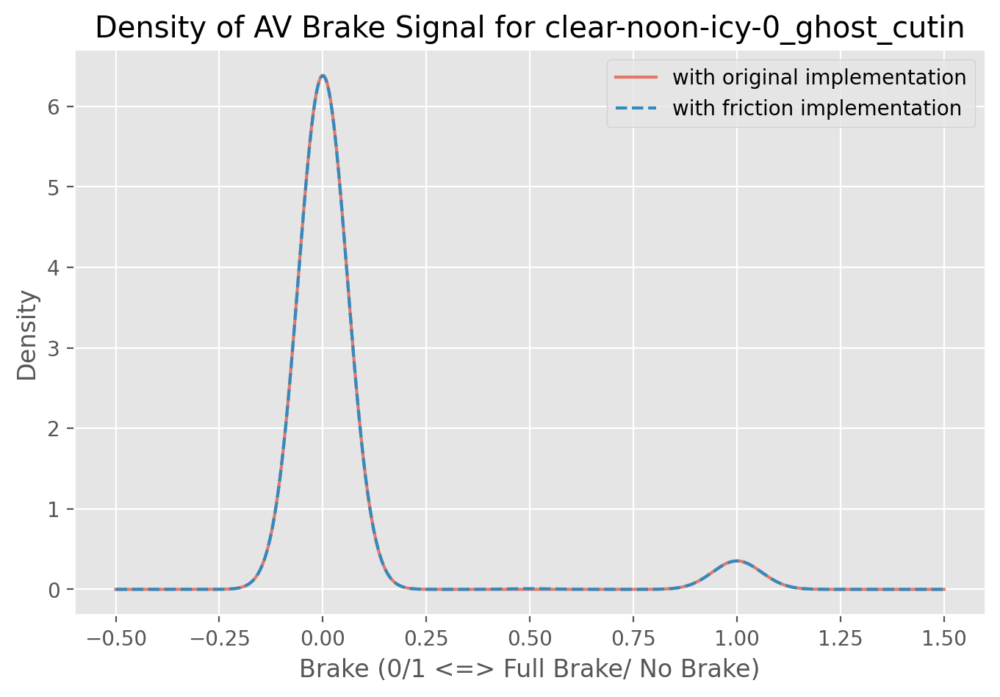

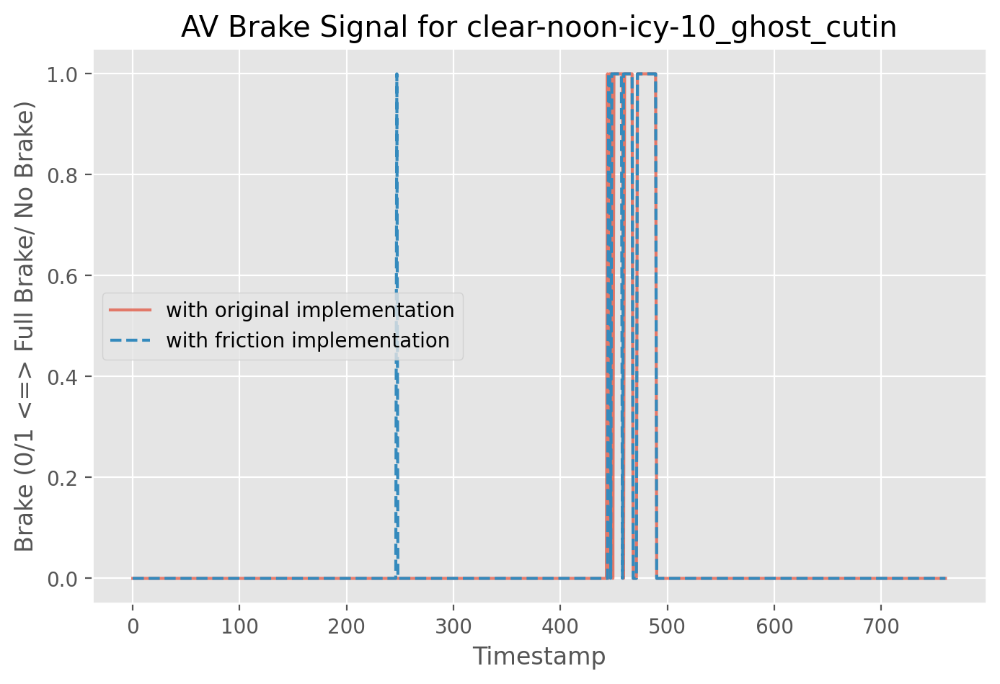

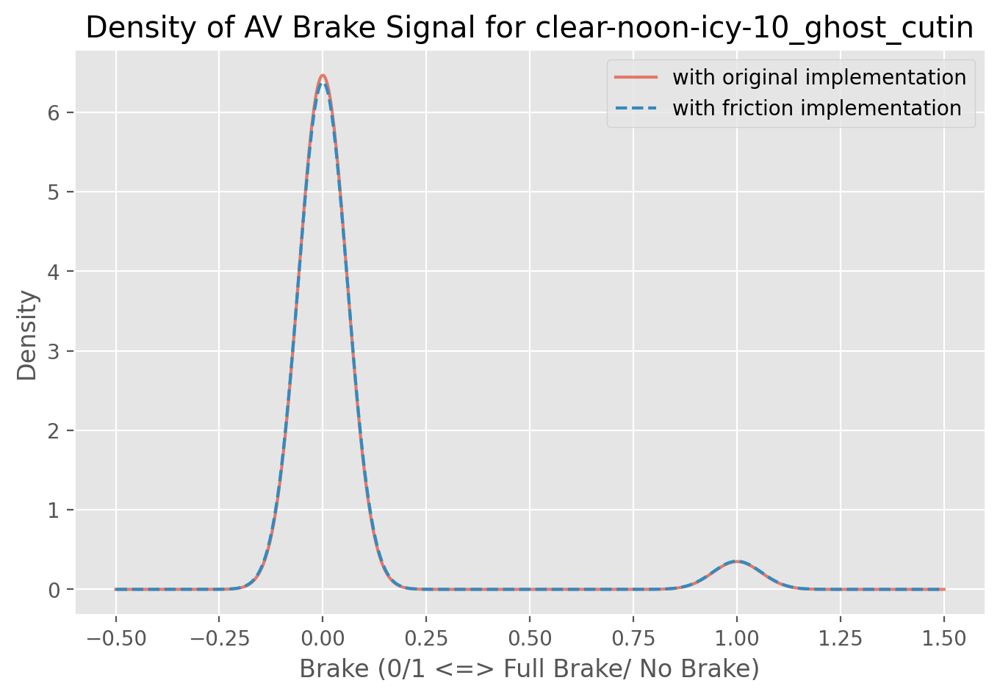

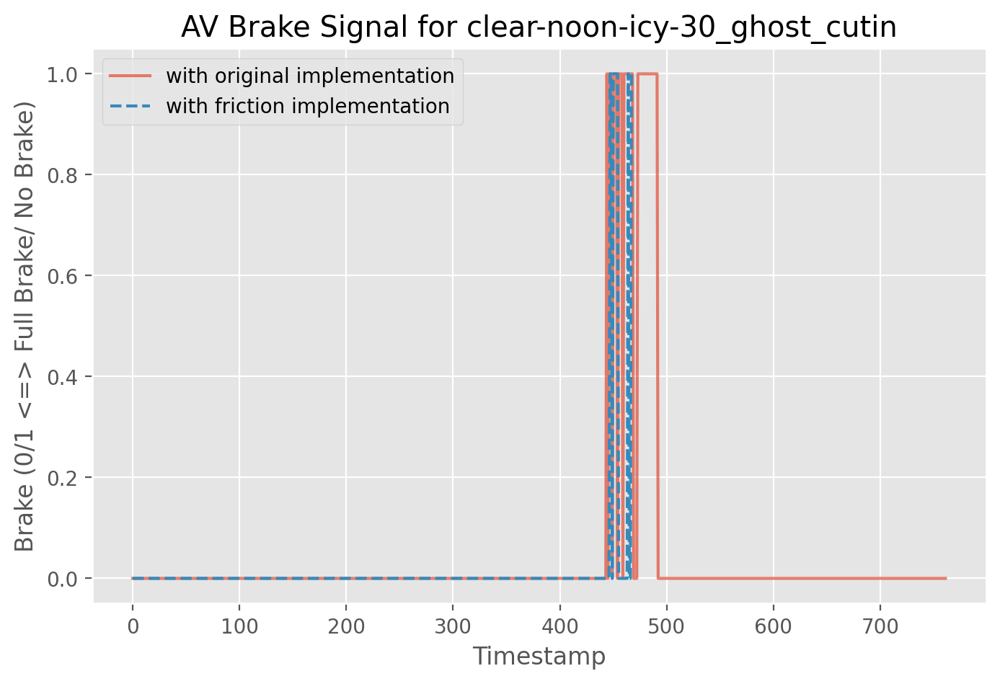

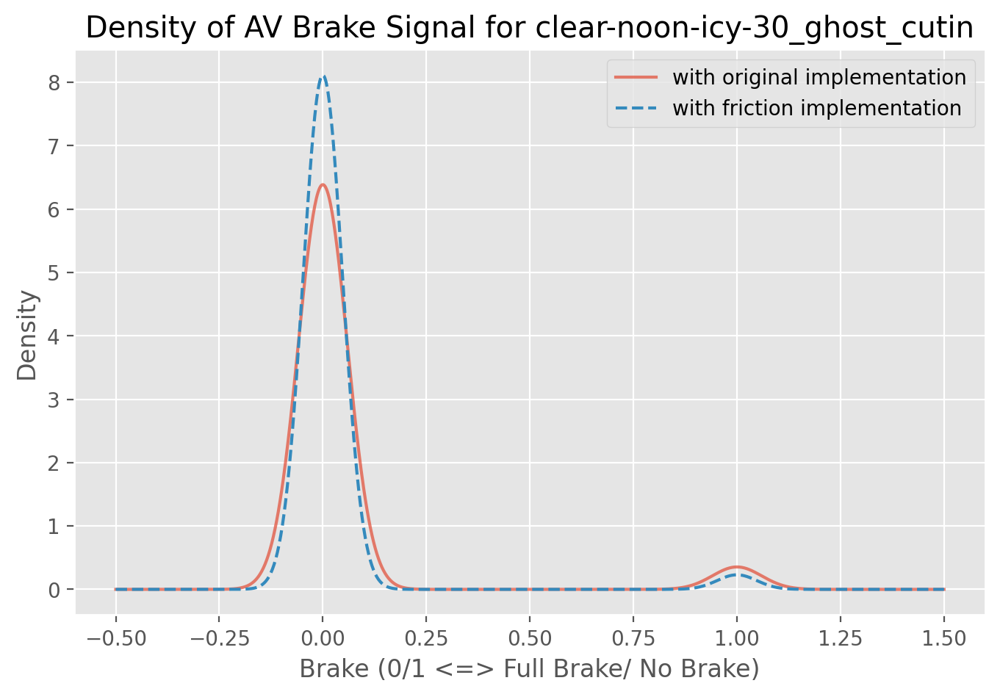

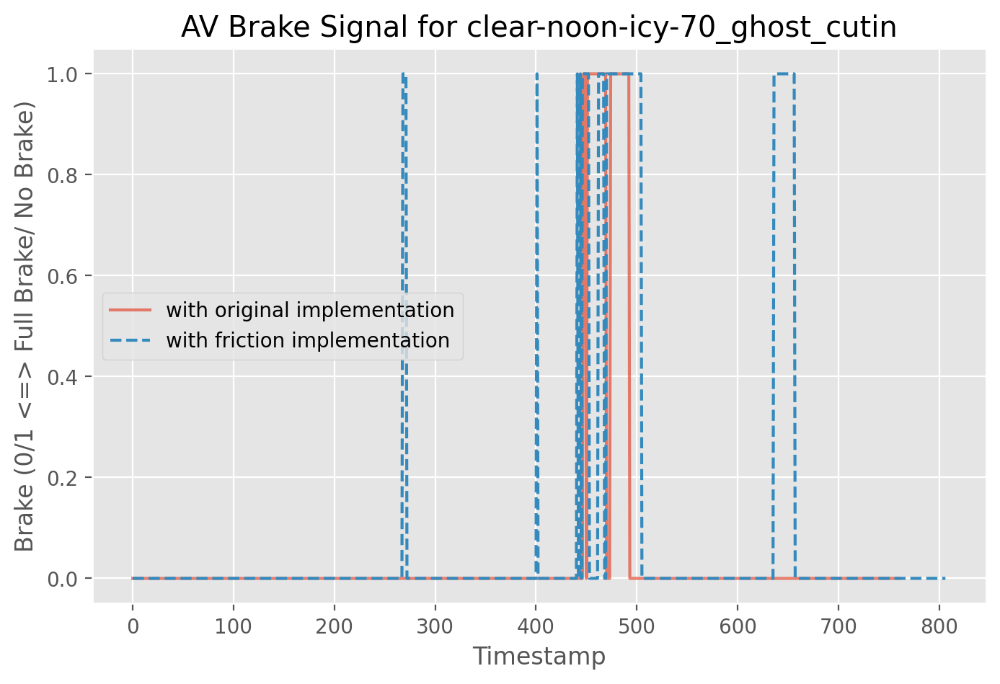

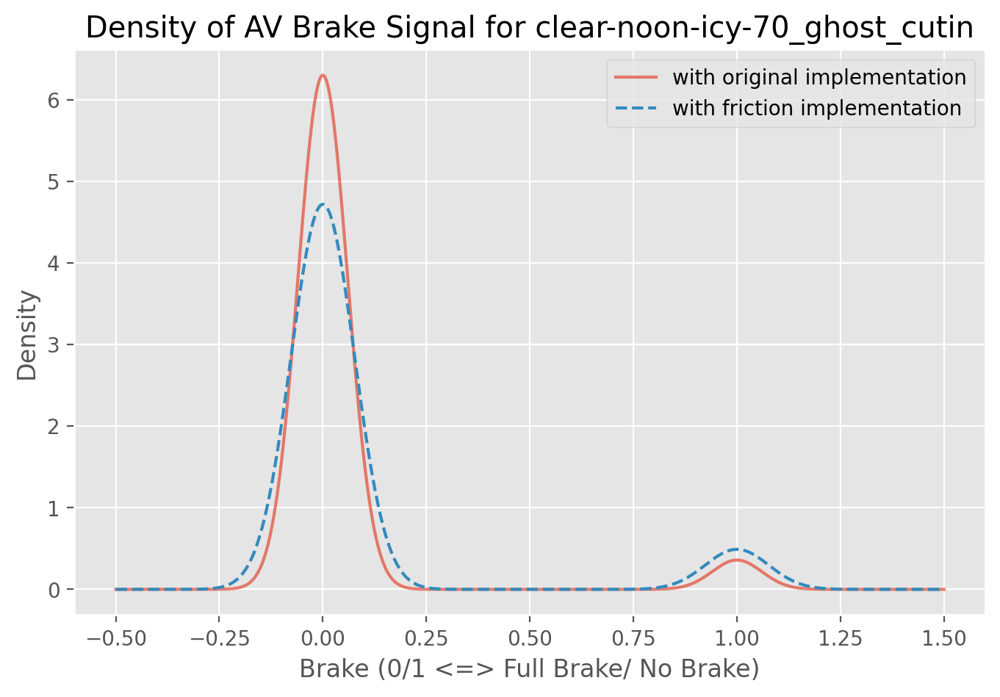

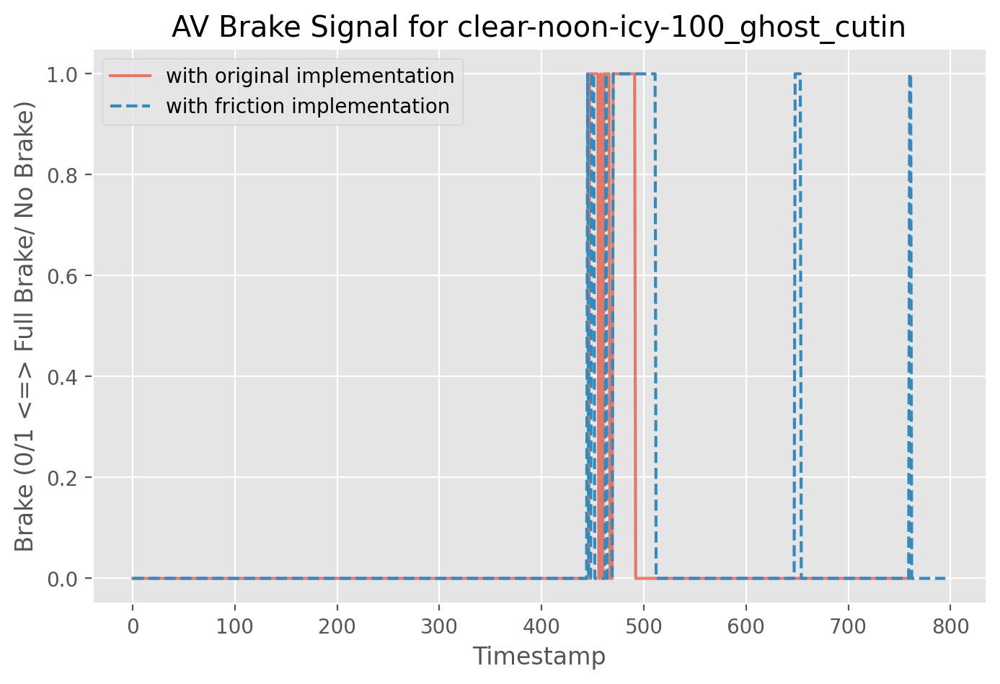

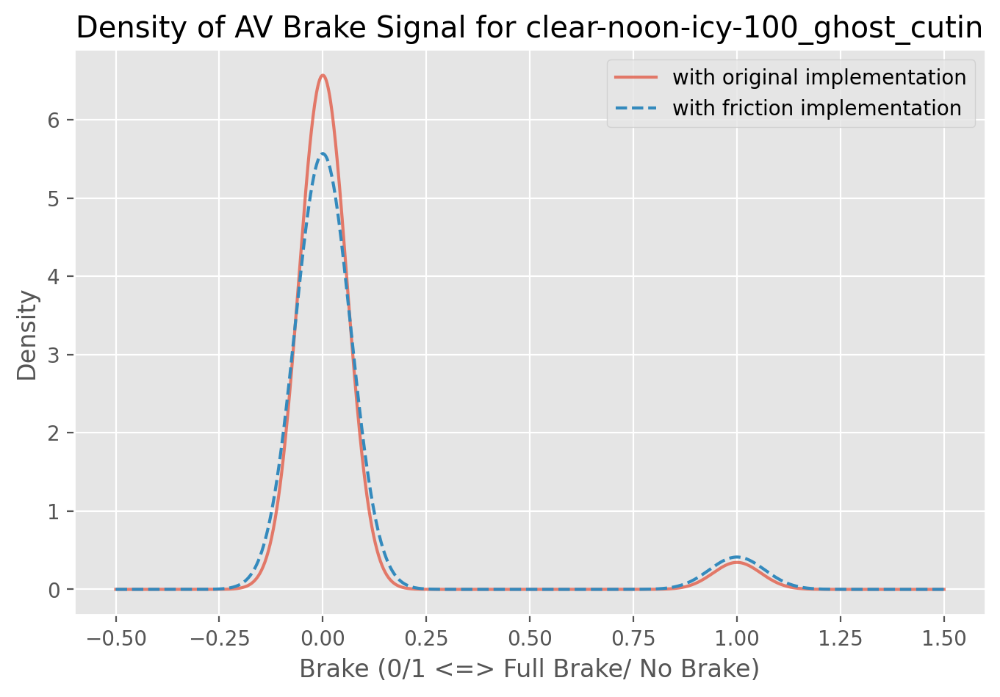

In [48]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_brake = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['brake'].isnull().values.any():
                df_orig_brake["Run"+str(i)] = df_array_orig[weather][i]['brake']

    median_orig_brake = df_orig_brake.median(axis=1)

    plt.plot(median_orig_brake, alpha=0.7)


    df_fric_brake = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['brake'].isnull().values.any():
                df_fric_brake["Run"+str(i)] = df_array_fric[weather][i]['brake']

    median_fric_brake = df_fric_brake.median(axis=1)
    
    all_medians[weather][5][0] = median_orig_brake
    all_medians[weather][5][1] = median_fric_brake
    
    plt.plot(median_fric_brake, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Brake (0/1 <=> Full Brake/ No Brake)")
    plt.title("AV Brake Signal for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Brake (0/1 <=> Full Brake/ No Brake)")
    plt.ylabel("Density")
    median_orig_brake.plot.density(alpha=0.7)
    median_fric_brake.plot.density(style='--')
    plt.title("Density of AV Brake Signal for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()


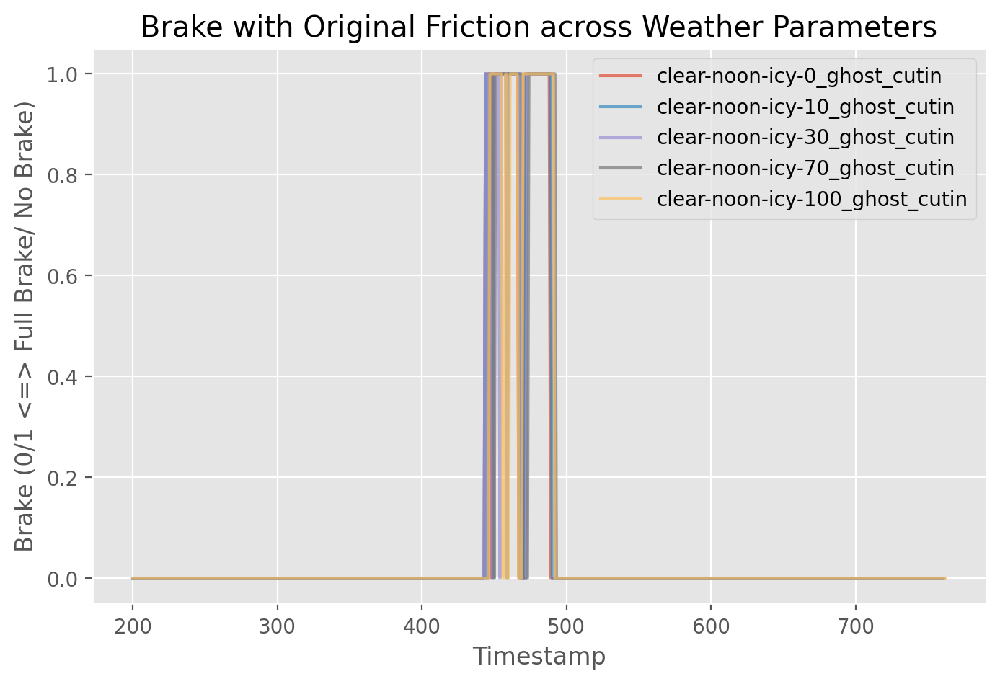

In [49]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_brake = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['brake'].dtypes == 'brake'):
            print(i)
        else:
            if not df_array_orig[weather][i]['brake'].isnull().values.any():
                df_orig_brake["Run"+str(i)] = df_array_orig[weather][i]['brake']

    median_orig_brake = df_orig_brake.median(axis=1)


    plt.plot(median_orig_brake[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Brake (0/1 <=> Full Brake/ No Brake)")
plt.title("Brake with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

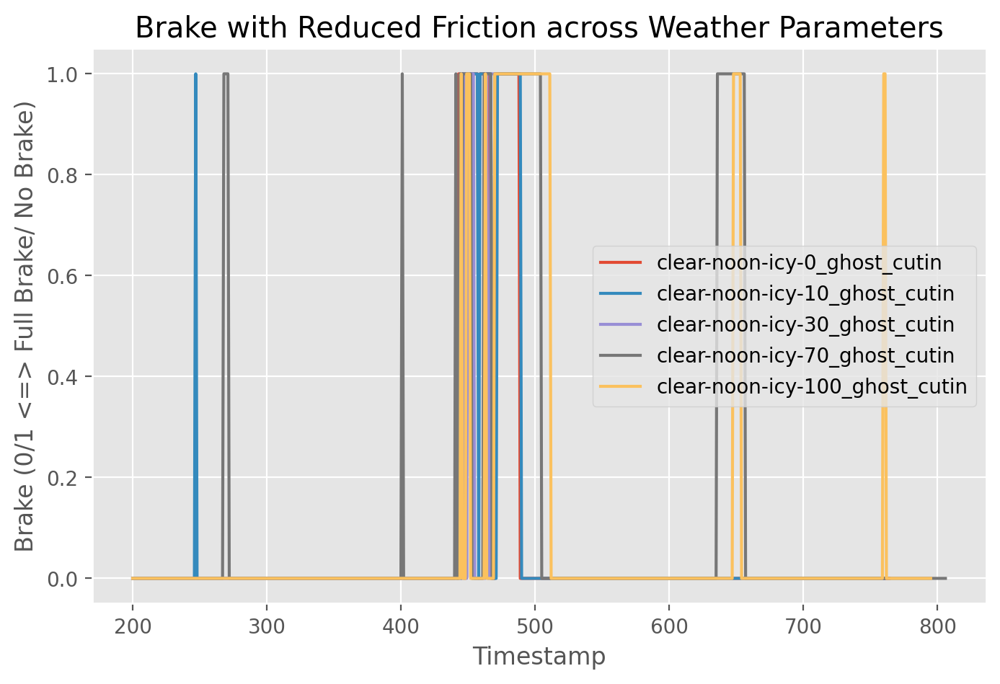

In [50]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_brake = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['brake'].isnull().values.any() :
                df_fric_brake["Run"+str(i)] = df_array_fric[weather][i]['brake']

    median_fric_brake = df_fric_brake.median(axis=1)

    plt.plot(median_fric_brake[200:])

plt.xlabel("Timestamp")
plt.ylabel("Brake (0/1 <=> Full Brake/ No Brake)")
plt.title("Brake with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

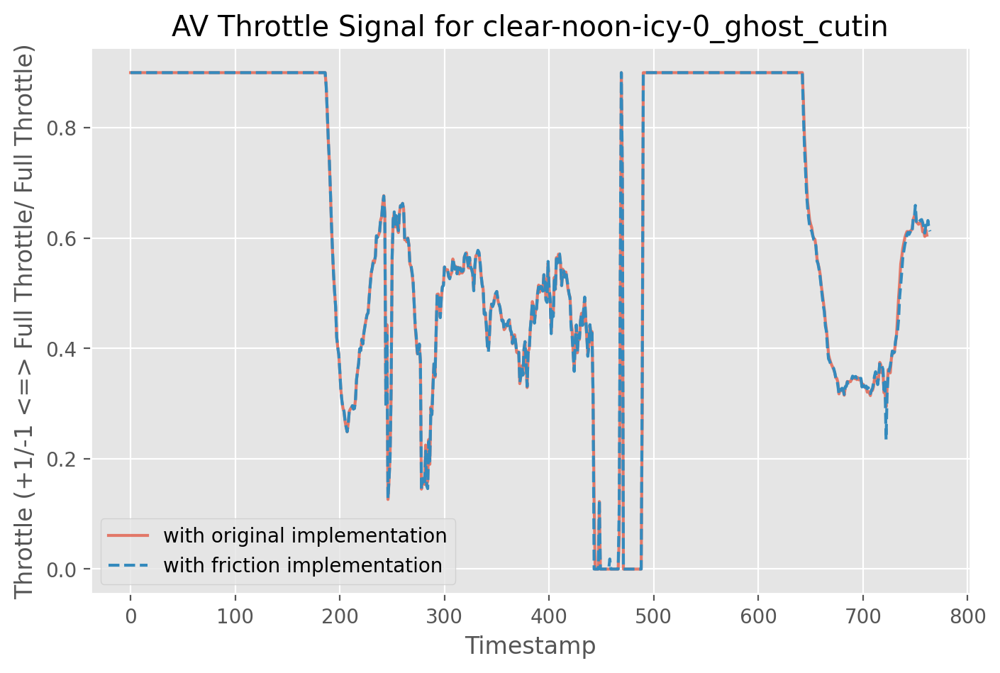

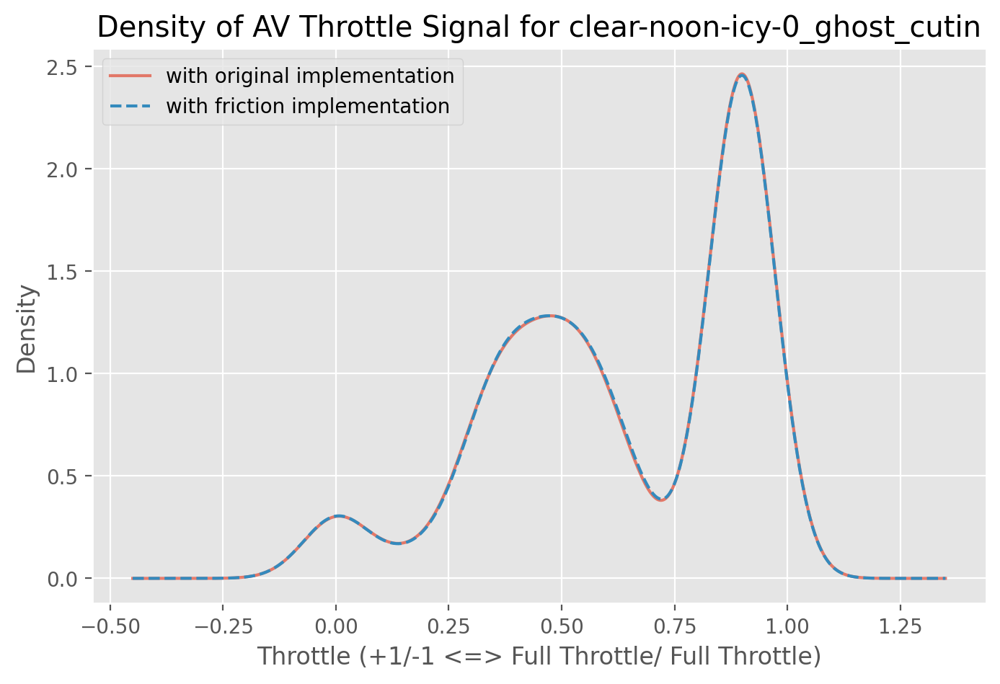

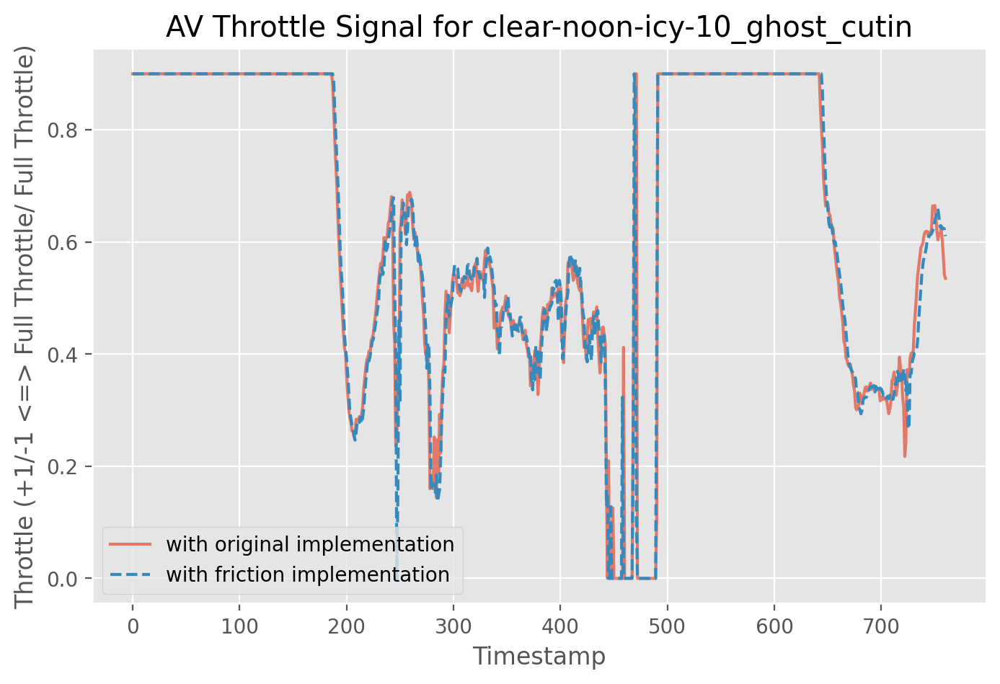

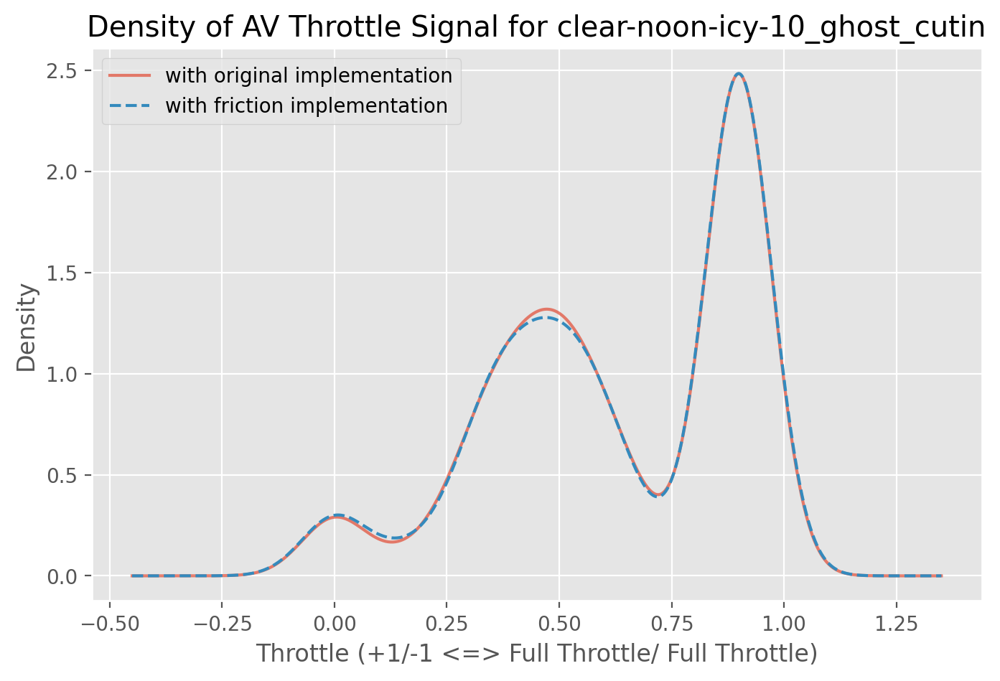

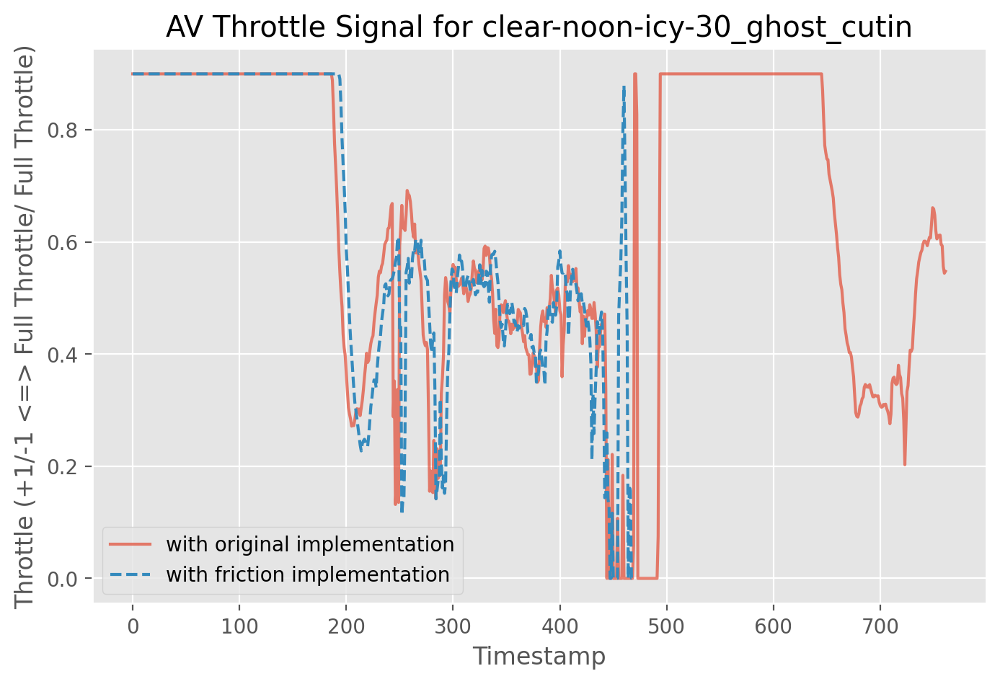

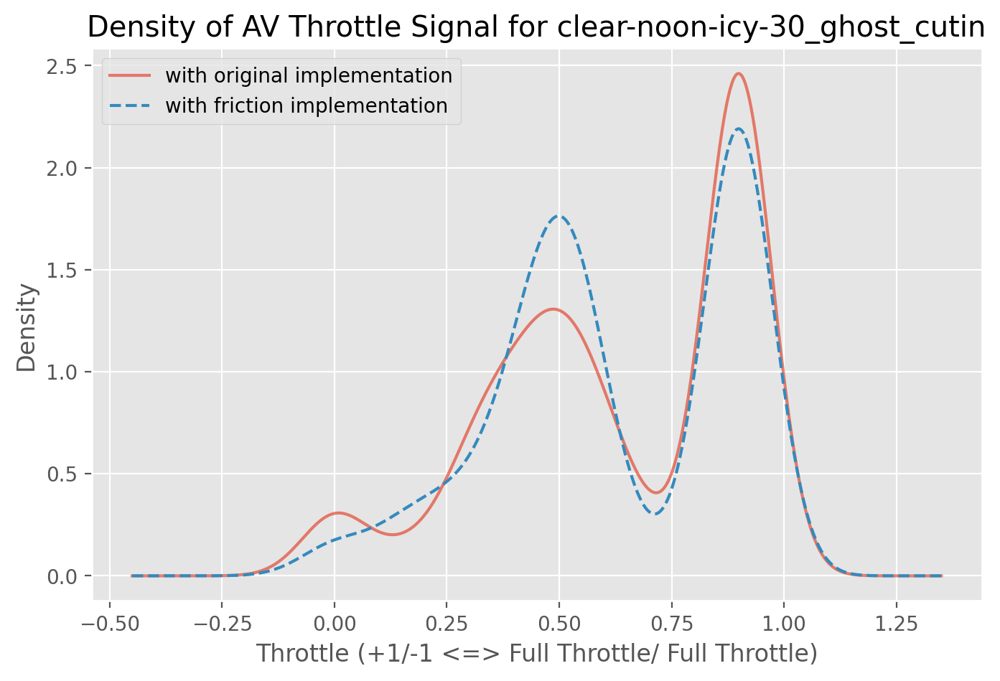

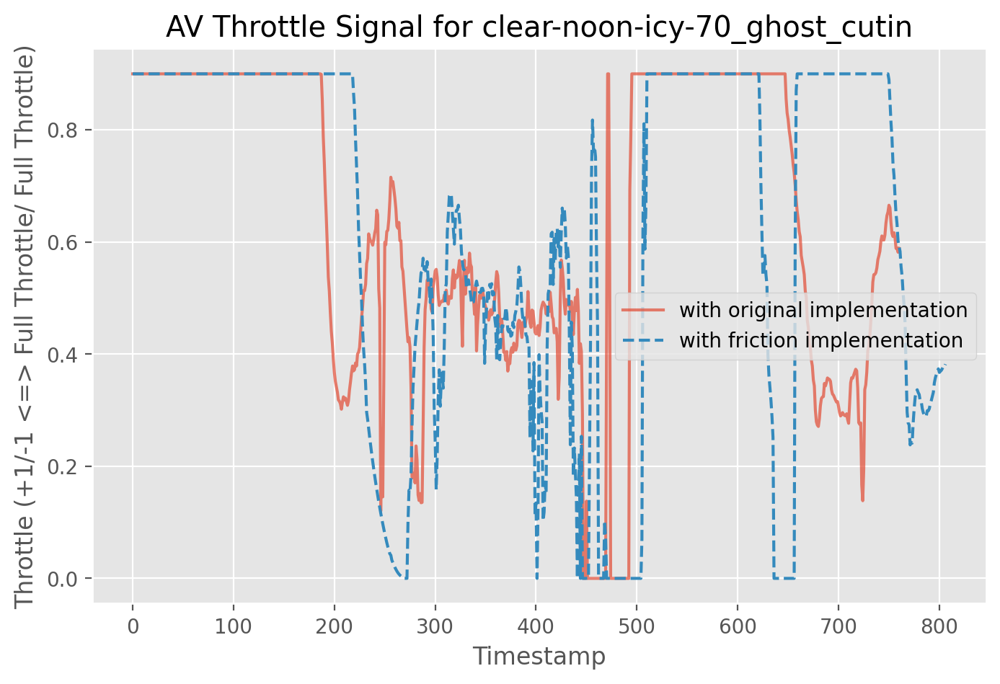

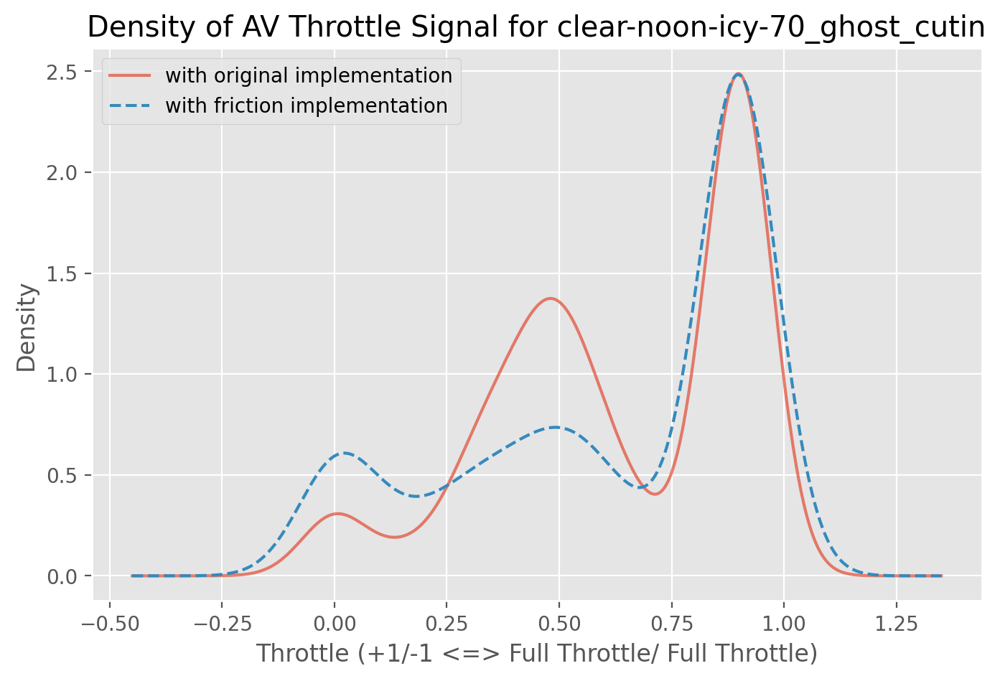

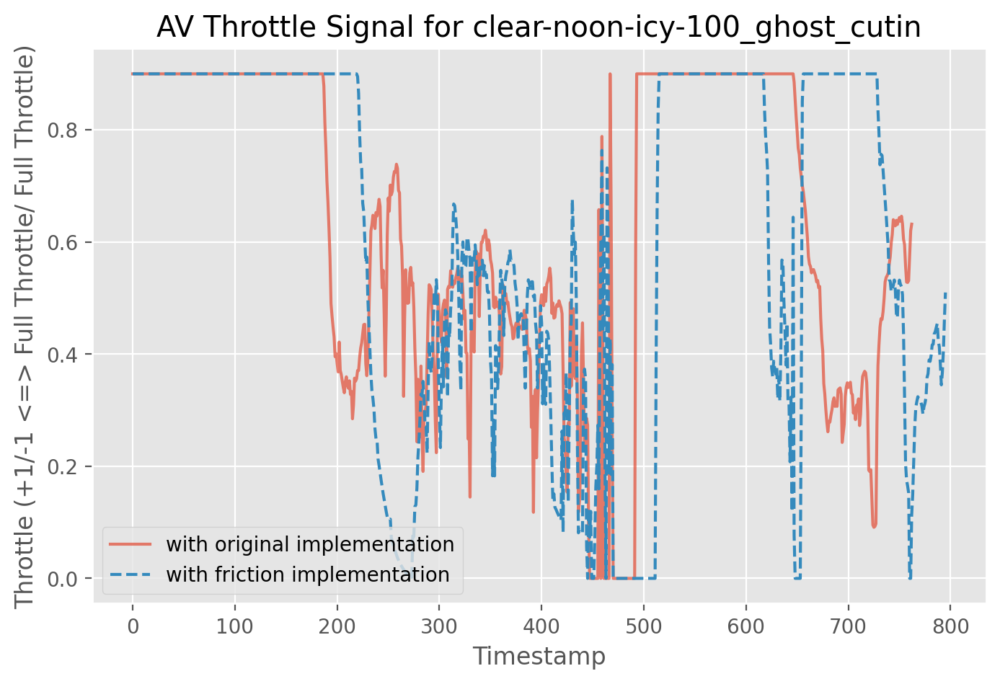

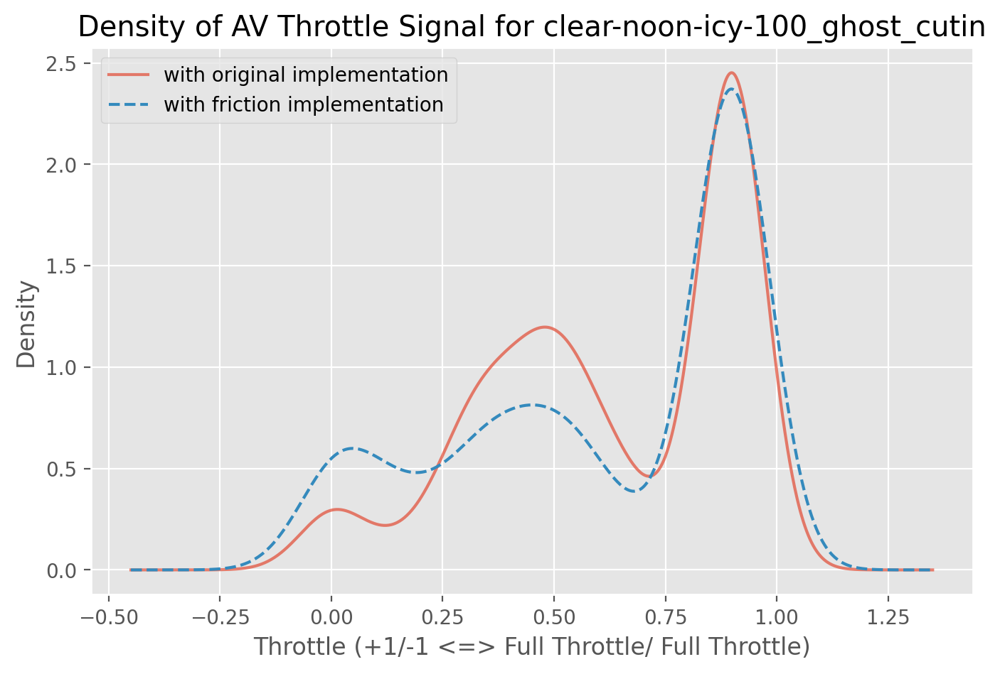

In [51]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_throttle = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['throttle'].isnull().values.any():
                df_orig_throttle["Run"+str(i)] = df_array_orig[weather][i]['throttle']

    median_orig_throttle = df_orig_throttle.median(axis=1)

    plt.plot(median_orig_throttle, alpha=0.7)


    df_fric_throttle = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['throttle'].isnull().values.any():
                df_fric_throttle["Run"+str(i)] = df_array_fric[weather][i]['throttle']

    median_fric_throttle = df_fric_throttle.median(axis=1)
    
    all_medians[weather][6][0] = median_orig_throttle
    all_medians[weather][6][1] = median_fric_throttle
    
    plt.plot(median_fric_throttle, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Throttle (+1/-1 <=> Full Throttle/ Full Throttle)")
    plt.title("AV Throttle Signal for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Throttle (+1/-1 <=> Full Throttle/ Full Throttle)")
    plt.ylabel("Density")
    median_orig_throttle.plot.density(alpha=0.7)
    median_fric_throttle.plot.density(style='--')
    plt.title("Density of AV Throttle Signal for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

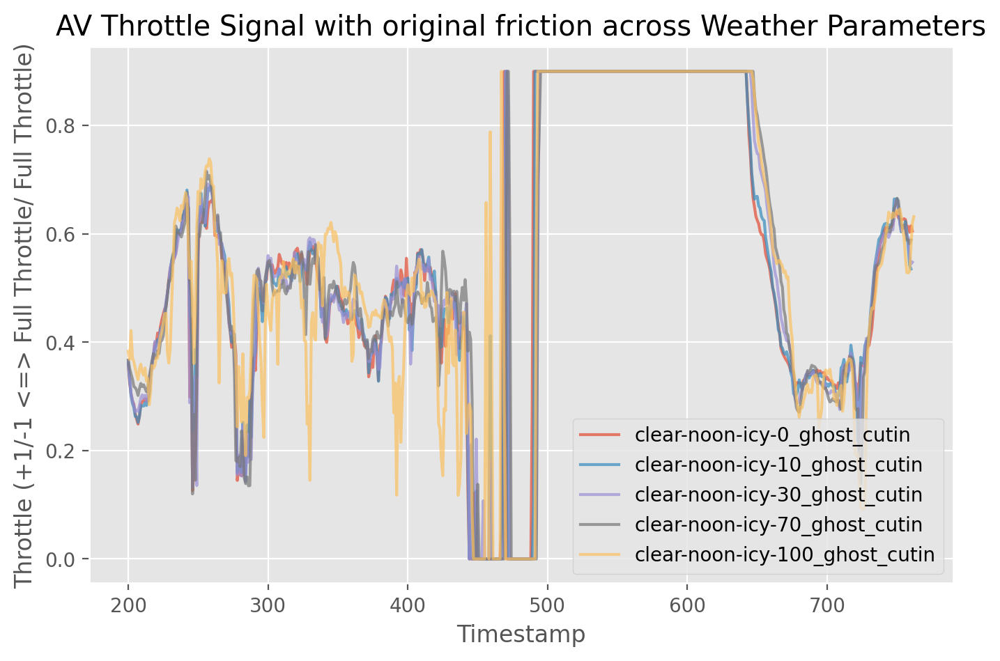

In [52]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_throttle = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['throttle'].dtypes == 'throttle'):
            print(i)
        else:
            if not df_array_orig[weather][i]['throttle'].isnull().values.any():
                df_orig_throttle["Run"+str(i)] = df_array_orig[weather][i]['throttle']

    median_orig_throttle = df_orig_throttle.median(axis=1)


    plt.plot(median_orig_throttle[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Throttle (+1/-1 <=> Full Throttle/ Full Throttle)")
plt.title("AV Throttle Signal with original friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

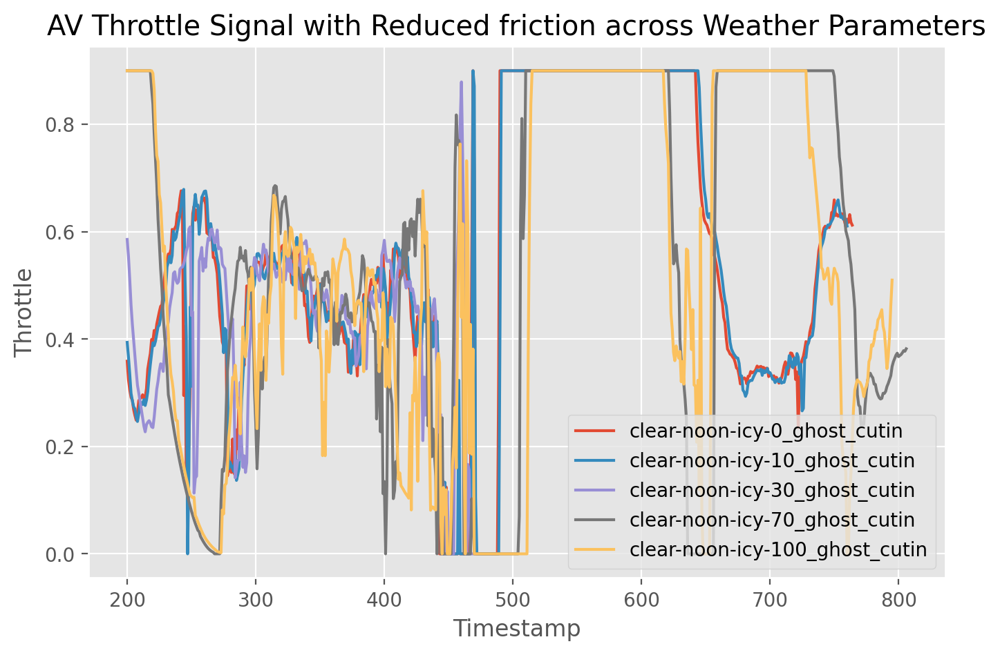

In [53]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_fric_throttle = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['throttle'].isnull().values.any() :
                df_fric_throttle["Run"+str(i)] = df_array_fric[weather][i]['throttle']

    median_fric_throttle = df_fric_throttle.median(axis=1)

    plt.plot(median_fric_throttle[200:])

    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("Throttle")
plt.title("AV Throttle Signal with Reduced friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

## Dynamic time warping (DTW) for cvip
### measuring similarity between two temporal sequences

In [54]:
all_dtw = [[0] * len(attribute_order)  for i in range(len(txt_lists_fric))]

for i in range(len(txt_lists_fric)):
    for j in range(len(attribute_order)):
        all_dtw[i][j] = dtw.distance(all_medians[i][j][0], all_medians[i][j][1])

In [55]:
for i in range(len(txt_lists_fric)):
    for j in range(len(attribute_order)):
        all_dtw[i][j] = round(all_dtw[i][j],2)

In [56]:
df = pd.DataFrame(all_dtw, columns = attribute_order, dtype = float)
df.index = subfolders
df.to_csv("DTW_ghost_cutin_icy.csv")
df

,x,y,v,cvip,steer,brake,throttle
clear-noon-icy-0_ghost_cutin,0.02,1.13,0.34,1.14,0.01,0.50,0.20
clear-noon-icy-10_ghost_cutin,0.04,1.42,0.69,1.06,0.03,0.00,0.63
clear-noon-icy-30_ghost_cutin,1.95,459.88,46.36,491.79,0.07,2.83,2.36
clear-noon-icy-70_ghost_cutin,0.60,1.74,10.34,286.06,0.23,3.00,2.32
clear-noon-icy-100_ghost_cutin,0.49,1.44,7.27,262.66,0.32,1.41,2.08


## KS Test for cvip

In [57]:
import scipy as sp

In [58]:
all_ks = np.empty((len(txt_lists_fric), len(attribute_order), 2))
# [[0] * len(attribute_order)  for i in range(len(txt_lists_fric)-1)]
for i in range(len(txt_lists_fric)-1):
    for j in range(len(attribute_order)):
        ks_test = sp.stats.ks_2samp(all_medians[i][j][0], all_medians[i][j][1])
        all_ks[i][j][0] = ks_test.pvalue
        all_ks[i][j][1] = ks_test.statistic

C:\Users\kilob\AppData\Local\Temp\ipykernel_19012\3582443724.py:5: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  ks_test = sp.stats.ks_2samp(all_medians[i][j][0], all_medians[i][j][1])


In [59]:
df = pd.DataFrame(all_ks[:,:,0], columns = attribute_order, dtype = float)
df.index = subfolders
df

,x,y,v,cvip,steer,brake,throttle
clear-noon-icy-0_ghost_cutin,9.655360e-01,1.000000e+00,1.000000e+00,1.000000e+00,9.999991e-01,1.000000e+00,1.000000e+00
clear-noon-icy-10_ghost_cutin,1.003237e-03,1.000000e+00,8.064403e-01,9.084509e-01,9.960583e-01,1.000000e+00,9.998905e-01
clear-noon-icy-30_ghost_cutin,2.770909e-31,4.624125e-40,1.427969e-02,8.611991e-50,6.062368e-03,9.907976e-01,1.352142e-02
clear-noon-icy-70_ghost_cutin,9.375631e-07,9.880735e-01,1.014551e-09,1.858544e-30,8.517950e-03,5.297302e-01,7.467143e-04
clear-noon-icy-100_ghost_cutin,1.257936e-311,1.257936e-311,1.257939e-311,1.257939e-311,1.257939e-311,1.257939e-311,1.257939e-311


In [60]:
df = pd.DataFrame(all_ks[:,:,1], columns = attribute_order, dtype = float)
df.index = subfolders
df

,x,y,v,cvip,steer,brake,throttle
clear-noon-icy-0_ghost_cutin,2.482116e-02,5.223612e-03,6.201431e-03,4.683238e-03,1.354537e-02,1.101333e-03,9.762750e-03
clear-noon-icy-10_ghost_cutin,9.986859e-02,1.051248e-02,3.285151e-02,2.890933e-02,2.102497e-02,1.314060e-03,1.708279e-02
clear-noon-icy-30_ghost_cutin,3.449108e-01,3.897638e-01,9.132412e-02,4.335769e-01,9.897015e-02,2.495107e-02,9.183015e-02
clear-noon-icy-70_ghost_cutin,1.356495e-01,2.206221e-02,1.643895e-01,2.944244e-01,8.287374e-02,4.029948e-02,9.974484e-02
clear-noon-icy-100_ghost_cutin,1.257939e-311,1.257935e-311,1.257939e-311,1.257936e-311,1.257939e-311,1.257935e-311,1.257935e-311
